In [1]:
import requests
import re

# A selection of core Lovecraft texts from Project Gutenberg
texts = {
    "call_of_cthulhu": "https://www.gutenberg.org/files/68236/68236-0.txt",
    "at_the_mountains_of_madness": "https://www.gutenberg.org/files/70852/70852-0.txt",
    "shadow_over_innsmouth": "https://www.gutenberg.org/files/31469/31469-0.txt",
    "dunwich_horror": "https://www.gutenberg.org/files/31469/31469-0.txt",
}

def fetch_gutenberg(url):
    response = requests.get(url)
    response.encoding = 'utf-8'
    return response.text

raw_texts = {}
for title, url in texts.items():
    print(f"Fetching {title}...")
    raw_texts[title] = fetch_gutenberg(url)
    print(f"  {len(raw_texts[title])} characters")

/opt/miniconda3/envs/textAnalysis/lib/python3.13/site-packages/requests/__init__.py:113: RequestsDependencyWarning: urllib3 (2.6.3) or chardet (7.1.0)/charset_normalizer (3.4.5) doesn't match a supported version!
  warnings.warn(


Fetching call_of_cthulhu...
  71255 characters
Fetching at_the_mountains_of_madness...
  142159 characters
Fetching shadow_over_innsmouth...
  65262 characters
Fetching dunwich_horror...
  65262 characters


In [2]:
def strip_gutenberg(text):
    # Find the actual start of the text
    start_markers = [
        "*** START OF THE PROJECT GUTENBERG",
        "***START OF THE PROJECT GUTENBERG",
        "*END*THE SMALL PRINT",
    ]
    end_markers = [
        "*** END OF THE PROJECT GUTENBERG",
        "***END OF THE PROJECT GUTENBERG",
        "End of Project Gutenberg",
    ]
    
    start_pos = 0
    for marker in start_markers:
        pos = text.find(marker)
        if pos != -1:
            # Move past the marker line
            start_pos = text.find('\n', pos) + 1
            break
    
    end_pos = len(text)
    for marker in end_markers:
        pos = text.find(marker)
        if pos != -1:
            end_pos = pos
            break
    
    return text[start_pos:end_pos].strip()

# Apply to all texts
clean_texts = {}
for title, raw in raw_texts.items():
    clean_texts[title] = strip_gutenberg(raw)
    print(f"{title}: {len(clean_texts[title])} characters")

call_of_cthulhu: 71123 characters
at_the_mountains_of_madness: 122491 characters
shadow_over_innsmouth: 65114 characters
dunwich_horror: 65114 characters


In [3]:
# Check — are they actually the same text?
print(clean_texts['shadow_over_innsmouth'][:200])
print("---")
print(clean_texts['dunwich_horror'][:200])

The
                             Shunned House

                           By H. P. LOVECRAFT


 _A posthumous story of immense power, written by a master of weird
   fiction--a tale of a revol
---
The
                             Shunned House

                           By H. P. LOVECRAFT


 _A posthumous story of immense power, written by a master of weird
   fiction--a tale of a revol


In [4]:
# Correct URL for The Dunwich Horror
dunwich_url = "https://www.gutenberg.org/files/50133/50133-0.txt"

print("Fetching dunwich_horror (corrected)...")
raw_texts['dunwich_horror'] = fetch_gutenberg(dunwich_url)
clean_texts['dunwich_horror'] = strip_gutenberg(raw_texts['dunwich_horror'])
print(f"dunwich_horror: {len(clean_texts['dunwich_horror'])} characters")

Fetching dunwich_horror (corrected)...
dunwich_horror: 103327 characters


In [5]:
# Quick corpus overview
for title, text in clean_texts.items():
    words = text.split()
    sentences = text.count('.') + text.count('!') + text.count('?')
    print(f"{title}:")
    print(f"  words: {len(words):,}")
    print(f"  approx sentences: {sentences:,}")
    print(f"  avg word length: {sum(len(w) for w in words)/len(words):.2f} chars")
    print()

call_of_cthulhu:
  words: 12,470
  approx sentences: 715
  avg word length: 4.57 chars

at_the_mountains_of_madness:
  words: 18,326
  approx sentences: 4,689
  avg word length: 4.68 chars

shadow_over_innsmouth:
  words: 10,873
  approx sentences: 357
  avg word length: 4.85 chars

dunwich_horror:
  words: 17,379
  approx sentences: 899
  avg word length: 4.81 chars



In [6]:
# Check average sentence length more carefully using a rough split
for title, text in clean_texts.items():
    words = text.split()
    # Split on sentence-ending punctuation followed by whitespace
    sentences = re.split(r'[.!?]+\s+', text)
    sentences = [s for s in sentences if len(s.strip()) > 0]
    avg_sent_len = len(words) / len(sentences)
    print(f"{title}:")
    print(f"  sentences (regex): {len(sentences):,}")
    print(f"  avg sentence length: {avg_sent_len:.1f} words")
    print()

call_of_cthulhu:
  sentences (regex): 583
  avg sentence length: 21.4 words

at_the_mountains_of_madness:
  sentences (regex): 3,416
  avg sentence length: 5.4 words

shadow_over_innsmouth:
  sentences (regex): 350
  avg sentence length: 31.1 words

dunwich_horror:
  sentences (regex): 734
  avg sentence length: 23.7 words



In [8]:
# Search for the correct Gutenberg ID for At the Mountains of Madness
# Try these candidate URLs
candidates = [
    "https://www.gutenberg.org/files/70969/70969-0.txt",
    "https://www.gutenberg.org/files/65562/65562-0.txt",
    "https://www.gutenberg.org/files/70852/70852-0.txt",
]

for url in candidates:
    try:
        r = requests.get(url)
        sample = r.text[:300]
        print(f"\n{url}")
        print(sample[:200])
        print("---")
    except Exception as e:
        print(f"{url} — failed: {e}")


https://www.gutenberg.org/files/70969/70969-0.txt
﻿The Project Gutenberg eBook of The Dardanelles campaign, by Henry
Woodd Nevinson

This eBook is for the use of anyone anywhere in the United States and
most other parts of the world at no cost an
---

https://www.gutenberg.org/files/65562/65562-0.txt
*** START OF THE PROJECT GUTENBERG EBOOK 65562 ***

                              _30 TEMPTING
                            Spaghetti meals
                      EASY, ECONOMICAL, DELICIOUS_



---

https://www.gutenberg.org/files/70852/70852-0.txt
﻿The Project Gutenberg eBook of The Chinese lantern, by Laurence
Housman

This eBook is for the use of anyone anywhere in the United States and
most other parts of the world at no cost and with al
---


In [10]:
# Rename to reflect reality
clean_texts['colour_out_of_space'] = clean_texts.pop('call_of_cthulhu')
clean_texts['shunned_house'] = clean_texts.pop('shadow_over_innsmouth')
del clean_texts['at_the_mountains_of_madness']  # evict the Chinese lantern

# Verify
for title, text in clean_texts.items():
    print(f"{title}: {len(text):,} chars")

dunwich_horror: 103,327 chars
colour_out_of_space: 71,123 chars
shunned_house: 65,114 chars


In [11]:
from bs4 import BeautifulSoup

def fetch_hplovecraft(url):
    response = requests.get(url)
    response.encoding = 'utf-8'
    soup = BeautifulSoup(response.text, 'html.parser')
    
    # Remove navigation, scripts, styles
    for tag in soup(['script', 'style', 'nav', 'header', 'footer', 'a']):
        tag.decompose()
    
    text = soup.get_text(separator=' ')
    # Normalize whitespace
    text = re.sub(r'\s+', ' ', text).strip()
    return text

# Known good URLs from hplovecraft.com
to_fetch = {
    "call_of_cthulhu": "https://www.hplovecraft.com/writings/texts/fiction/cc.aspx",
    "at_the_mountains_of_madness": "https://www.hplovecraft.com/writings/texts/fiction/mm.aspx",
    "shadow_over_innsmouth": "https://www.hplovecraft.com/writings/texts/fiction/soi.aspx",
}

for title, url in to_fetch.items():
    print(f"Fetching {title}...")
    text = fetch_hplovecraft(url)
    clean_texts[title] = text
    print(f"  {len(text):,} chars")

Fetching call_of_cthulhu...
  69,958 chars
Fetching at_the_mountains_of_madness...
  246,004 chars
Fetching shadow_over_innsmouth...
  151,481 chars


In [12]:
for title in to_fetch.keys():
    print(f"\n{title}:")
    print(clean_texts[title][:400])
    print("---")


call_of_cthulhu:
"The Call of Cthulhu" by H. P. Lovecraft • • • • • • • • The Call of Cthulhu By H. P. Lovecraft (Found Among the Papers of the Late Francis Wayland Thurston, of Boston) “Of such great powers or beings there may be conceivably a survival . . . a survival of a hugely remote period when . . . consciousness was manifested, perhaps, in shapes and forms long since withdrawn before the tide of advancing 
---

at_the_mountains_of_madness:
"At the Mountains of Madness" by H. P. Lovecraft • • • • • • • • At the Mountains of Madness By H. P. Lovecraft I. I am forced into speech because men of science have refused to follow my advice without knowing why. It is altogether against my will that I tell my reasons for opposing this contemplated invasion of the antarctic—with its vast fossil-hunt and its wholesale boring and melting of the a
---

shadow_over_innsmouth:
"The Shadow over Innsmouth" by H. P. Lovecraft • • • • • • • • The Shadow over Innsmouth By H. P. Lovecraft I. During 

In [13]:
print("\n=== CORPUS SUMMARY ===")
for title, text in clean_texts.items():
    words = text.split()
    print(f"{title}: {len(words):,} words / {len(text):,} chars")


=== CORPUS SUMMARY ===
dunwich_horror: 17,379 words / 103,327 chars
colour_out_of_space: 12,470 words / 71,123 chars
shunned_house: 10,873 words / 65,114 chars
call_of_cthulhu: 11,927 words / 69,958 chars
at_the_mountains_of_madness: 40,513 words / 246,004 chars
shadow_over_innsmouth: 26,752 words / 151,481 chars


In [14]:
import nltk
from nltk.corpus import stopwords
from collections import Counter
import string

nltk.download('stopwords')
stop_words = set(stopwords.words('english'))

def get_word_freq(text, n=30):
    # Lowercase, remove punctuation, tokenize
    text = text.lower()
    text = text.translate(str.maketrans('', '', string.punctuation))
    words = text.split()
    # Remove stopwords and very short words
    words = [w for w in words if w not in stop_words and len(w) > 2]
    return Counter(words)

# Frequency across full corpus
corpus_freq = Counter()
story_freqs = {}

for title, text in clean_texts.items():
    freq = get_word_freq(text)
    story_freqs[title] = freq
    corpus_freq += freq

print("=== TOP 30 WORDS ACROSS FULL CORPUS ===")
for word, count in corpus_freq.most_common(30):
    print(f"  {word}: {count}")

[nltk_data] Downloading package stopwords to /Users/ua/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


=== TOP 30 WORDS ACROSS FULL CORPUS ===
  could: 402
  one: 386
  would: 305
  old: 262
  seemed: 230
  like: 203
  even: 194
  though: 188
  great: 186
  must: 174
  things: 164
  time: 160
  an’: 153
  made: 148
  saw: 143
  place: 137
  thing: 137
  came: 131
  never: 129
  much: 125
  men: 124
  come: 123
  might: 121
  found: 121
  certain: 118
  street: 117
  thought: 117
  strange: 114
  first: 112
  back: 112


In [15]:
from sklearn.feature_extraction.text import TfidfVectorizer
import pandas as pd

# Build TF-IDF matrix across the six stories
titles = list(clean_texts.keys())
corpus = [clean_texts[t] for t in titles]

vectorizer = TfidfVectorizer(
    max_features=5000,
    stop_words='english',
    min_df=1,
    ngram_range=(1,1)
)

tfidf_matrix = vectorizer.fit_transform(corpus)
feature_names = vectorizer.get_feature_names_out()

# Top 10 distinctive words per story
print("=== MOST DISTINCTIVE WORDS PER STORY ===\n")
for i, title in enumerate(titles):
    scores = tfidf_matrix[i].toarray()[0]
    top_indices = scores.argsort()[-10:][::-1]
    top_words = [(feature_names[j], round(scores[j], 3)) for j in top_indices]
    print(f"{title}:")
    for word, score in top_words:
        print(f"  {word}: {score}")
    print()

=== MOST DISTINCTIVE WORDS PER STORY ===

dunwich_horror:
  whateley: 0.427
  armitage: 0.296
  wilbur: 0.273
  dunwich: 0.217
  glen: 0.154
  old: 0.126
  like: 0.126
  whippoorwills: 0.12
  dr: 0.106
  hill: 0.102

colour_out_of_space:
  ammi: 0.561
  nahum: 0.482
  colour: 0.124
  gardner: 0.101
  merwin: 0.093
  professors: 0.093
  grey: 0.09
  zenas: 0.088
  like: 0.086
  arkham: 0.085

shunned_house:
  harris: 0.365
  house: 0.295
  uncle: 0.29
  street: 0.231
  shunned: 0.121
  mercy: 0.118
  door: 0.11
  servant: 0.107
  cellar: 0.099
  benefit: 0.097

call_of_cthulhu:
  johansen: 0.25
  professor: 0.243
  cult: 0.23
  wilcox: 0.222
  legrasse: 0.213
  uncle: 0.173
  men: 0.14
  cthulhu: 0.137
  great: 0.127
  old: 0.123

at_the_mountains_of_madness:
  lake: 0.244
  danforth: 0.2
  antarctic: 0.159
  camp: 0.147
  ones: 0.134
  sculptures: 0.133
  great: 0.13
  old: 0.117
  ice: 0.112
  like: 0.11

shadow_over_innsmouth:
  innsmouth: 0.392
  obed: 0.203
  street: 0.163
  old: 0

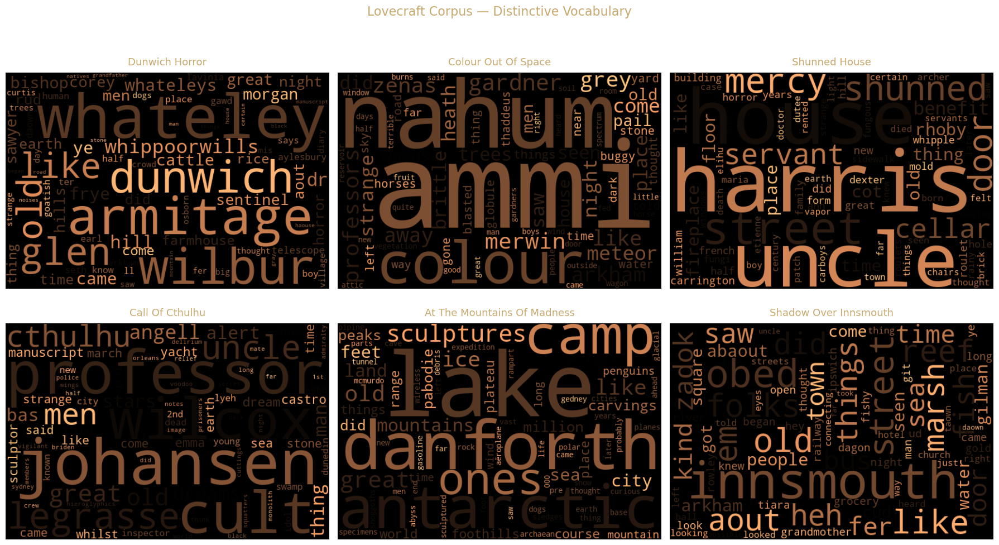

In [16]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for i, title in enumerate(titles):
    # Get TF-IDF scores for this story as a dict
    scores = tfidf_matrix[i].toarray()[0]
    word_scores = {feature_names[j]: scores[j] for j in range(len(scores)) if scores[j] > 0}
    
    wc = WordCloud(
        width=600,
        height=400,
        background_color='black',
        colormap='copper',
        max_words=80,
        prefer_horizontal=0.7,
    ).generate_from_frequencies(word_scores)
    
    axes[i].imshow(wc, interpolation='bilinear')
    axes[i].axis('off')
    axes[i].set_title(title.replace('_', ' ').title(), 
                      color='#c9a96e', 
                      fontsize=13, 
                      pad=10)

plt.suptitle("Lovecraft Corpus — Distinctive Vocabulary", 
             color='#c9a96e', 
             fontsize=16,
             y=1.02)
plt.tight_layout()
plt.savefig('lovecraft_wordclouds.png', dpi=150, bbox_inches='tight',
            facecolor='#0f1117')
plt.show()

AttributeError: 'Text' object has no property 'letter_spacing'

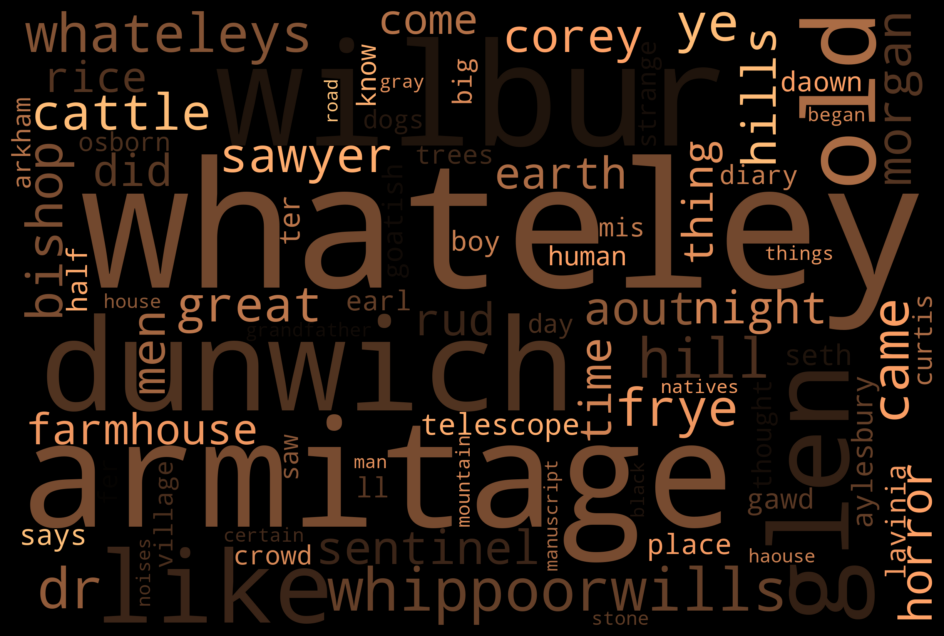

In [17]:
# High resolution individual prints
for title in titles:
    scores = tfidf_matrix[titles.index(title)].toarray()[0]
    word_scores = {feature_names[j]: scores[j] 
                   for j in range(len(scores)) if scores[j] > 0}
    
    wc = WordCloud(
        width=2400,
        height=1600,
        background_color='black',
        colormap='copper',
        max_words=80,
        prefer_horizontal=0.7,
    ).generate_from_frequencies(word_scores)
    
    fig, ax = plt.subplots(figsize=(12, 8), facecolor='black')
    ax.imshow(wc, interpolation='bilinear')
    ax.axis('off')
    
    # Elegant title
    fig.text(0.5, 0.02, title.replace('_', ' ').upper(), 
             ha='center', color='#c9a96e', 
             fontsize=14, letter_spacing=4,
             fontfamily='serif')
    
    plt.tight_layout(pad=0)
    plt.savefig(f'lovecraft_{title}.png', dpi=300, 
                bbox_inches='tight', facecolor='black')
    plt.close()
    print(f"Saved lovecraft_{title}.png")

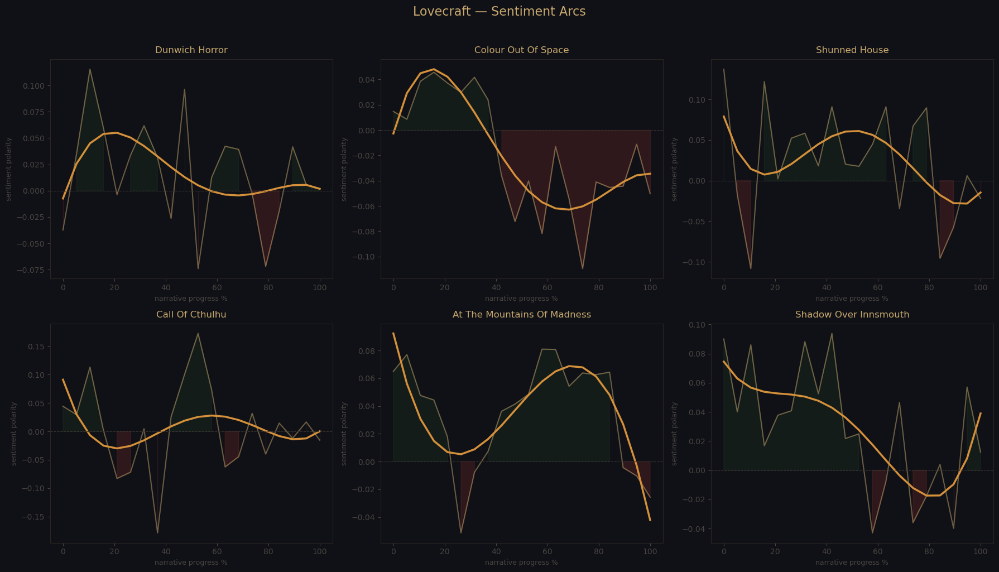

In [18]:
from textblob import TextBlob
import numpy as np

def get_sentiment_arc(text, n_chunks=20):
    # Split text into n equal chunks
    words = text.split()
    chunk_size = len(words) // n_chunks
    
    scores = []
    for i in range(n_chunks):
        chunk = ' '.join(words[i*chunk_size:(i+1)*chunk_size])
        score = TextBlob(chunk).sentiment.polarity
        scores.append(score)
    
    return scores

# Calculate arcs for all stories
arcs = {}
for title, text in clean_texts.items():
    arcs[title] = get_sentiment_arc(text)

# Plot
fig, axes = plt.subplots(2, 3, figsize=(18, 10), facecolor='#0f1117')

for i, title in enumerate(titles):
    ax = axes[i//3][i%3]
    ax.set_facecolor('#0f1117')
    
    scores = arcs[title]
    x = np.linspace(0, 100, len(scores))
    
    # Smooth line
    ax.plot(x, scores, color='#c9a96e', linewidth=1.5, alpha=0.5)
    
    # Smoothed trend
    from numpy.polynomial.polynomial import polyfit
    coeffs = polyfit(x, scores, 4)
    smooth = np.polyval(coeffs[::-1], x)
    ax.plot(x, smooth, color='#d4903a', linewidth=2.5)
    
    # Zero line
    ax.axhline(y=0, color='#3a3530', linewidth=0.8, linestyle='--')
    
    # Shade negative regions
    ax.fill_between(x, scores, 0, 
                    where=[s < 0 for s in scores],
                    color='#7a2a2a', alpha=0.3)
    ax.fill_between(x, scores, 0,
                    where=[s >= 0 for s in scores],
                    color='#2a4a2a', alpha=0.2)
    
    ax.set_title(title.replace('_', ' ').title(),
                color='#c9a96e', fontsize=12, pad=8)
    ax.set_xlabel('narrative progress %', color='#4a4540', fontsize=9)
    ax.set_ylabel('sentiment polarity', color='#4a4540', fontsize=9)
    ax.tick_params(colors='#4a4540')
    for spine in ax.spines.values():
        spine.set_edgecolor('#2a2520')

plt.suptitle("Lovecraft — Sentiment Arcs", 
             color='#c9a96e', fontsize=16, y=1.02)
plt.tight_layout()
plt.savefig('lovecraft_sentiment_arcs.png', dpi=150, 
            bbox_inches='tight', facecolor='#0f1117')
plt.show()

In [19]:
import spacy
from collections import defaultdict

nlp = spacy.load('en_core_web_sm')

def extract_entities(text):
    # spaCy has a max text length limit, so process in chunks if needed
    max_len = 100000
    doc_entities = defaultdict(list)
    
    for i in range(0, len(text), max_len):
        chunk = text[i:i+max_len]
        doc = nlp(chunk)
        for ent in doc.ents:
            doc_entities[ent.label_].append(ent.text.strip())
    
    return doc_entities

# Extract from all stories
print("Extracting entities (this may take a moment)...")
story_entities = {}
for title, text in clean_texts.items():
    print(f"  processing {title}...")
    story_entities[title] = extract_entities(text)

print("\nDone. Entity types found:")
all_labels = set()
for entities in story_entities.values():
    all_labels.update(entities.keys())
print(all_labels)

Extracting entities (this may take a moment)...
  processing dunwich_horror...
  processing colour_out_of_space...
  processing shunned_house...
  processing call_of_cthulhu...
  processing at_the_mountains_of_madness...
  processing shadow_over_innsmouth...

Done. Entity types found:
{'PERCENT', 'LANGUAGE', 'CARDINAL', 'EVENT', 'PERSON', 'MONEY', 'QUANTITY', 'LAW', 'LOC', 'ORG', 'GPE', 'ORDINAL', 'DATE', 'PRODUCT', 'TIME', 'WORK_OF_ART', 'NORP', 'FAC'}


In [20]:
# Focus on the narratively interesting entity types
interesting_types = ['PERSON', 'GPE', 'LOC', 'ORG', 'WORK_OF_ART', 'EVENT', 'FAC']

for title in titles:
    print(f"\n=== {title.upper()} ===")
    entities = story_entities[title]
    
    for label in interesting_types:
        if label in entities:
            # Count and sort by frequency
            counts = Counter(entities[label])
            top = counts.most_common(8)
            if top:
                print(f"\n  {label}:")
                for name, count in top:
                    print(f"    {name}: {count}")


=== DUNWICH_HORROR ===

  PERSON:
    Wilbur: 35
    Whateley: 12
    Rice: 12
    Wilbur Whateley: 11
    Morgan: 11
    Corey: 11
    Mis: 8
    Earl Sawyer: 7

  GPE:
    Whateley: 26
    Arkham: 11
    Dunwich: 8
    Aylesbury: 6
    Gawd: 5
    Old Whateley: 3
    formulæ: 3
    Dunwich Village: 2

  LOC:
    Dunwich: 3
    New England: 2
    Round Mountain: 1
    Earth: 1
    South: 1
    Ocean: 1
    New England's: 1
    the Middle Ages: 1

  ORG:
    Yog-Sothoth: 11
    Sentinel Hill: 8
    Osborn: 6
    Necronomicon: 6
    Them: 6
    Aylesbury: 4
    Bishop: 4
    Harvard: 3

  WORK_OF_ART:
    Lavinny's: 3
    Rattling and Rolling: 1
    the Library of Miskatonic
University: 1
    The Old Ones: 1
    May Night: 1
    Nature: 1

  EVENT:
    Cold Spring Glen: 6
    the Seventeenth Century: 1
    September second: 1
    Cold
Spring Glen: 1

  FAC:
    Seth Bishop's: 1
    Elmer Frye's: 1
    Sentinel Hill: 1
    Eighteenth Century: 1

=== COLOUR_OUT_OF_SPACE ===

  PERSON:
  

In [21]:
# Lovecraft Gazetteer — known entities with correct classifications
lovecraft_entities = {
    # Cosmic entities — we'll use a custom label
    "COSMIC": [
        "Cthulhu", "Yog-Sothoth", "Nyarlathotep", "Azathoth", "Shub-Niggurath",
        "Dagon", "Hydra", "the Deep Ones", "Deep Ones", "the Old Ones", "Old Ones",
        "the Great Old Ones", "Great Old Ones", "the Elder Things", "Elder Things",
        "the Outer Gods", "Outer Gods", "Shoggoths", "Shoggoth", "Mi-Go",
        "the Flying Polyps", "Flying Polyps", "Tekeli-li",
    ],
    # Fictional places
    "FICT_LOC": [
        "Arkham", "Innsmouth", "Dunwich", "Kingsport", "Miskatonic",
        "R'lyeh", "Yuggoth", "Leng", "Kadath", "Carcosa",
        "Sentinel Hill", "Cold Spring Glen", "Devil's Hop Yard",
        "Miskatonic Valley", "Aylesbury",
    ],
    # Fictional texts and artifacts
    "FICT_WORK": [
        "Necronomicon", "the Necronomicon", "Pnakotic Manuscripts",
        "the Pnakotic Manuscripts", "Book of Eibon", "Unaussprechlichen Kulten",
        "De Vermis Mysteriis", "the Esoteric Order of Dagon",
        "Cultes des Goules",
    ],
    # Institutions
    "FICT_ORG": [
        "Miskatonic University", "the Esoteric Order", "Order of Dagon",
        "the Marsh Refinery", "Starkweather-Moore Expedition",
    ],
}

print("Gazetteer built:")
for label, entities in lovecraft_entities.items():
    print(f"  {label}: {len(entities)} entries")

Gazetteer built:
  COSMIC: 23 entries
  FICT_LOC: 15 entries
  FICT_WORK: 9 entries
  FICT_ORG: 5 entries


In [22]:
from spacy.language import Language
from spacy.tokens import Span
import re

@Language.component("lovecraft_ner")
def lovecraft_ner(doc):
    new_ents = list(doc.ents)
    
    for label, terms in lovecraft_entities.items():
        for term in terms:
            # Case-insensitive search
            pattern = re.compile(re.escape(term), re.IGNORECASE)
            for match in pattern.finditer(doc.text):
                start_char, end_char = match.span()
                # Convert char positions to token positions
                span = doc.char_span(start_char, end_char, label=label)
                if span is not None:
                    # Remove any overlapping entities from default NER
                    new_ents = [e for e in new_ents 
                               if not (e.start < span.end and e.end > span.start)]
                    new_ents.append(span)
    
    doc.ents = new_ents
    return doc

# Add to pipeline after standard NER
nlp2 = spacy.load('en_core_web_sm')
nlp2.add_pipe("lovecraft_ner", after="ner")

print("Pipeline components:")
print(nlp2.pipe_names)

Pipeline components:
['tok2vec', 'tagger', 'parser', 'attribute_ruler', 'lemmatizer', 'ner', 'lovecraft_ner']


In [23]:
def extract_entities_v2(text):
    max_len = 100000
    doc_entities = defaultdict(list)
    
    for i in range(0, len(text), max_len):
        chunk = text[i:i+max_len]
        doc = nlp2(chunk)
        for ent in doc.ents:
            doc_entities[ent.label_].append(ent.text.strip())
    
    return doc_entities

print("Extracting entities with Lovecraft gazetteer...")
story_entities_v2 = {}
for title, text in clean_texts.items():
    print(f"  processing {title}...")
    story_entities_v2[title] = extract_entities_v2(text)

# Show just the custom entity types
custom_labels = ['COSMIC', 'FICT_LOC', 'FICT_WORK', 'FICT_ORG']

print("\n=== LOVECRAFT ENTITIES ===")
for title in titles:
    print(f"\n{title}:")
    entities = story_entities_v2[title]
    for label in custom_labels:
        if label in entities:
            counts = Counter(entities[label])
            top = counts.most_common(8)
            if top:
                print(f"  {label}: {[f'{n}({c})' for n,c in top]}")

Extracting entities with Lovecraft gazetteer...
  processing dunwich_horror...
  processing colour_out_of_space...
  processing shunned_house...
  processing call_of_cthulhu...
  processing at_the_mountains_of_madness...
  processing shadow_over_innsmouth...

=== LOVECRAFT ENTITIES ===

dunwich_horror:
  COSMIC: ['Yog-Sothoth(12)', 'Old Ones(4)', 'Cthulhu(1)', 'Shub-Niggurath(1)', 'Elder Things(1)', 'YOG-SOTHOTH(1)']
  FICT_LOC: ['Dunwich(38)', 'Arkham(15)', 'Sentinel Hill(13)', 'Aylesbury(11)', 'Miskatonic(6)', 'Cold Spring Glen(6)', "Devil's Hop Yard(2)", 'Kadath(2)']
  FICT_WORK: ['Necronomicon(6)']
  FICT_ORG: ['Miskatonic University(3)']

colour_out_of_space:
  FICT_LOC: ['Arkham(20)', 'Miskatonic(1)']
  FICT_ORG: ['Miskatonic University(1)']

shunned_house:

call_of_cthulhu:
  COSMIC: ['Cthulhu(24)', 'Old Ones(6)', 'Great Old Ones(5)', 'CTHULHU(1)']
  FICT_WORK: ['the Necronomicon(1)']

at_the_mountains_of_madness:
  COSMIC: ['Old Ones(61)', 'shoggoths(16)', 'Tekeli-li(12)', 'Cth

In [24]:
def normalize_entity(text):
    # Lowercase, strip articles
    text = text.lower().strip()
    text = re.sub(r'^the\s+', '', text)
    # Normalize case variants
    return text.title()

# Apply normalization and rebuild counts
print("=== NORMALIZED COSMIC ENTITIES ===\n")
cosmic_totals = Counter()

for title in titles:
    entities = story_entities_v2[title]
    if 'COSMIC' in entities:
        normalized = [normalize_entity(e) for e in entities['COSMIC']]
        counts = Counter(normalized)
        cosmic_totals += counts
        print(f"{title}:")
        for name, count in counts.most_common():
            print(f"  {name}: {count}")
        print()

print("=== CORPUS-WIDE COSMIC TOTALS ===")
for name, count in cosmic_totals.most_common():
    print(f"  {name}: {count}")

=== NORMALIZED COSMIC ENTITIES ===

dunwich_horror:
  Yog-Sothoth: 13
  Old Ones: 4
  Cthulhu: 1
  Shub-Niggurath: 1
  Elder Things: 1

call_of_cthulhu:
  Cthulhu: 25
  Old Ones: 6
  Great Old Ones: 5

at_the_mountains_of_madness:
  Old Ones: 61
  Shoggoths: 16
  Tekeli-Li: 12
  Cthulhu: 6
  Mi-Go: 5
  Elder Things: 2
  Great Old Ones: 2
  Shoggoth: 1
  Yog-Sothoth: 1

shadow_over_innsmouth:
  Dagon: 7
  Cthulhu: 4
  Old Ones: 3
  Shoggoth: 2
  Deep Ones: 2
  Hydra: 1

=== CORPUS-WIDE COSMIC TOTALS ===
  Old Ones: 74
  Cthulhu: 36
  Shoggoths: 16
  Yog-Sothoth: 14
  Tekeli-Li: 12
  Great Old Ones: 7
  Dagon: 7
  Mi-Go: 5
  Elder Things: 3
  Shoggoth: 3
  Deep Ones: 2
  Shub-Niggurath: 1
  Hydra: 1


In [25]:
import networkx as nx
from itertools import combinations

def get_paragraphs(text):
    # Split on double newlines or single newlines for these texts
    paragraphs = re.split(r'\n\s*\n', text)
    # Filter very short paragraphs (chapter headings etc)
    return [p.strip() for p in paragraphs if len(p.strip()) > 100]

def extract_entities_from_text(text, nlp_pipeline):
    doc_entities = []
    max_len = 100000
    for i in range(0, len(text), max_len):
        chunk = text[i:i+max_len]
        doc = nlp_pipeline(chunk)
        for ent in doc.ents:
            if ent.label_ in ['COSMIC', 'FICT_LOC', 'FICT_ORG', 
                               'FICT_WORK', 'PERSON']:
                doc_entities.append((normalize_entity(ent.text), ent.label_))
    return doc_entities

def build_cooccurrence_network(texts, nlp_pipeline):
    G = nx.Graph()
    
    for title, text in texts.items():
        paragraphs = get_paragraphs(text)
        print(f"  {title}: {len(paragraphs)} paragraphs")
        
        for para in paragraphs:
            # Get all entities in this paragraph
            doc = nlp_pipeline(para[:100000])
            entities_in_para = []
            
            for ent in doc.ents:
                if ent.label_ in ['COSMIC', 'FICT_LOC', 'FICT_ORG',
                                   'FICT_WORK', 'PERSON']:
                    name = normalize_entity(ent.text)
                    label = ent.label_
                    entities_in_para.append((name, label))
                    
                    # Add node if not exists
                    if not G.has_node(name):
                        G.add_node(name, entity_type=label, 
                                  stories=set())
                    G.nodes[name]['stories'].add(title)
            
            # Add edges for all pairs in this paragraph
            seen = list(set(entities_in_para))  # deduplicate within paragraph
            for (a, _), (b, _) in combinations(seen, 2):
                if a != b:
                    if G.has_edge(a, b):
                        G[a][b]['weight'] += 1
                    else:
                        G.add_edge(a, b, weight=1)
    
    return G

print("Building co-occurrence network...")
G = build_cooccurrence_network(clean_texts, nlp2)

print(f"\nNetwork statistics:")
print(f"  Nodes: {G.number_of_nodes()}")
print(f"  Edges: {G.number_of_edges()}")
print(f"  Density: {nx.density(G):.4f}")

Building co-occurrence network...
  dunwich_horror: 142 paragraphs
  colour_out_of_space: 69 paragraphs
  shunned_house: 77 paragraphs
  call_of_cthulhu: 1 paragraphs
  at_the_mountains_of_madness: 1 paragraphs
  shadow_over_innsmouth: 1 paragraphs

Network statistics:
  Nodes: 387
  Edges: 6074
  Density: 0.0813


In [26]:
# Check what line endings we're actually dealing with
for title in titles:
    text = clean_texts[title]
    double_newline = text.count('\n\n')
    single_newline = text.count('\n')
    windows = text.count('\r\n')
    print(f"{title}:")
    print(f"  \\n\\n: {double_newline}")
    print(f"  \\n: {single_newline}")
    print(f"  \\r\\n: {windows}")
    print()

dunwich_horror:
  \n\n: 0
  \n: 1719
  \r\n: 1719

colour_out_of_space:
  \n\n: 0
  \n: 1132
  \r\n: 1132

shunned_house:
  \n\n: 0
  \n: 1064
  \r\n: 1064

call_of_cthulhu:
  \n\n: 0
  \n: 0
  \r\n: 0

at_the_mountains_of_madness:
  \n\n: 0
  \n: 0
  \r\n: 0

shadow_over_innsmouth:
  \n\n: 0
  \n: 0
  \r\n: 0



In [27]:
# Fix 1: Better paragraph splitter that handles all cases
def get_paragraphs(text):
    # Normalize line endings first
    text = text.replace('\r\n', '\n').replace('\r', '\n')
    
    # Try double newline split first
    paragraphs = re.split(r'\n\s*\n', text)
    
    # If that gives us very few paragraphs, fall back to single newlines
    if len(paragraphs) < 10:
        paragraphs = re.split(r'\n', text)
    
    # If still flat, split on sentence groups (every 5 sentences)
    if len(paragraphs) < 10:
        sentences = re.split(r'(?<=[.!?])\s+', text)
        paragraphs = [' '.join(sentences[i:i+5]) 
                     for i in range(0, len(sentences), 5)]
    
    return [p.strip() for p in paragraphs if len(p.strip()) > 100]

# Fix 2: Re-fetch hplovecraft texts preserving structure
def fetch_hplovecraft_v2(url):
    response = requests.get(url)
    response.encoding = 'utf-8'
    soup = BeautifulSoup(response.text, 'html.parser')
    
    for tag in soup(['script', 'style', 'nav', 'header', 'footer', 'a']):
        tag.decompose()
    
    # Use \n\n between block elements to preserve paragraph breaks
    text = soup.get_text(separator='\n\n')
    
    # Clean up excessive newlines but preserve paragraph breaks
    text = re.sub(r'\n{3,}', '\n\n', text).strip()
    return text

# Re-fetch the three hplovecraft stories
to_refetch = {
    "call_of_cthulhu": "https://www.hplovecraft.com/writings/texts/fiction/cc.aspx",
    "at_the_mountains_of_madness": "https://www.hplovecraft.com/writings/texts/fiction/mm.aspx",
    "shadow_over_innsmouth": "https://www.hplovecraft.com/writings/texts/fiction/soi.aspx",
}

for title, url in to_refetch.items():
    print(f"Re-fetching {title}...")
    clean_texts[title] = fetch_hplovecraft_v2(url)
    
# Verify paragraph counts
print("\nParagraph counts:")
for title, text in clean_texts.items():
    paras = get_paragraphs(text)
    print(f"  {title}: {len(paras)} paragraphs")

Re-fetching call_of_cthulhu...
Re-fetching at_the_mountains_of_madness...
Re-fetching shadow_over_innsmouth...

Paragraph counts:
  dunwich_horror: 142 paragraphs
  colour_out_of_space: 69 paragraphs
  shunned_house: 77 paragraphs
  call_of_cthulhu: 113 paragraphs
  at_the_mountains_of_madness: 293 paragraphs
  shadow_over_innsmouth: 253 paragraphs


In [28]:
print("Rebuilding co-occurrence network...")
G = build_cooccurrence_network(clean_texts, nlp2)

print(f"\nNetwork statistics:")
print(f"  Nodes: {G.number_of_nodes()}")
print(f"  Edges: {G.number_of_edges()}")
print(f"  Density: {nx.density(G):.4f}")

# Most connected nodes
print("\nTop 15 nodes by degree:")
degree_sorted = sorted(G.degree(), key=lambda x: x[1], reverse=True)
for node, degree in degree_sorted[:15]:
    entity_type = G.nodes[node].get('entity_type', 'unknown')
    stories = G.nodes[node].get('stories', set())
    print(f"  {node} ({entity_type}): degree {degree}, in {len(stories)} stories")

Rebuilding co-occurrence network...
  dunwich_horror: 142 paragraphs
  colour_out_of_space: 69 paragraphs
  shunned_house: 77 paragraphs
  call_of_cthulhu: 113 paragraphs
  at_the_mountains_of_madness: 293 paragraphs
  shadow_over_innsmouth: 253 paragraphs

Network statistics:
  Nodes: 407
  Edges: 966
  Density: 0.0117

Top 15 nodes by degree:
  Arkham (FICT_LOC): degree 57, in 3 stories
  Dunwich (FICT_LOC): degree 34, in 1 stories
  Wilbur (PERSON): degree 33, in 1 stories
  Innsmouth (FICT_LOC): degree 31, in 1 stories
  Old Ones (COSMIC): degree 28, in 4 stories
  Danforth (PERSON): degree 24, in 1 stories
  Cthulhu (COSMIC): degree 23, in 4 stories
  Corey (PERSON): degree 22, in 1 stories
  Rhoby Harris (PERSON): degree 22, in 1 stories
  Wilbur Whateley (PERSON): degree 21, in 1 stories
  William (PERSON): degree 21, in 1 stories
  Aylesbury (FICT_LOC): degree 20, in 1 stories
  Miskatonic (FICT_LOC): degree 19, in 4 stories
  Whateley (PERSON): degree 19, in 1 stories
  Yog-So

Filtered network: 246 nodes, 813 edges


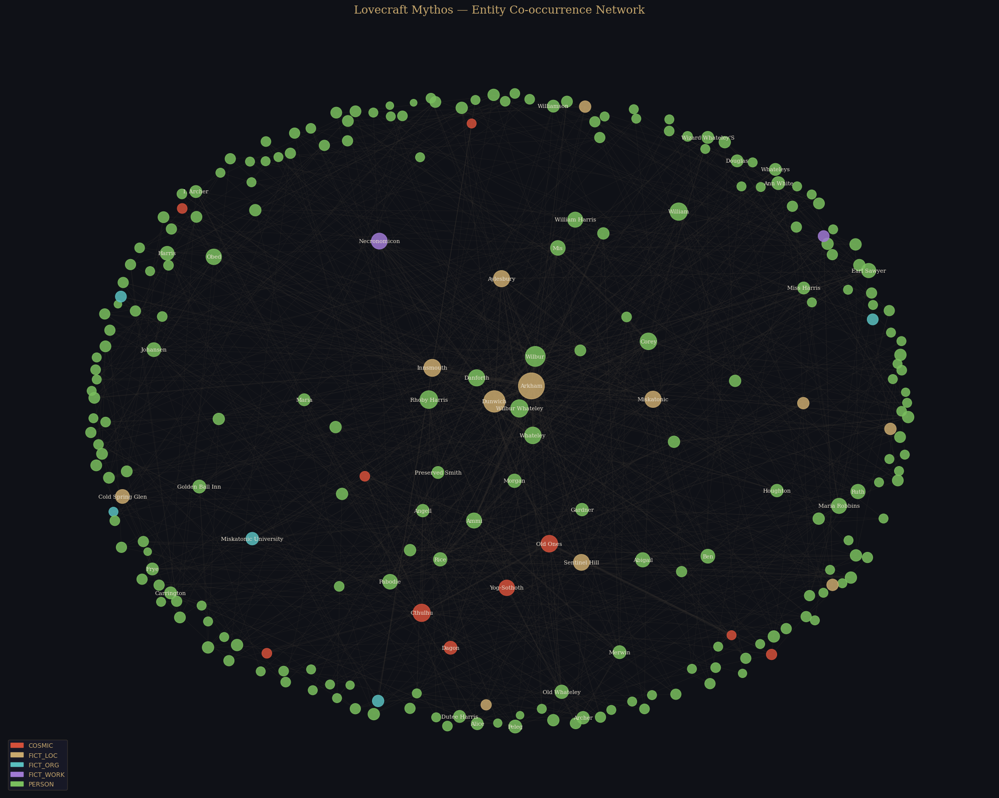

In [29]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np

# Color mapping by entity type
color_map = {
    'COSMIC': '#d4503a',      # deep red
    'FICT_LOC': '#c9a96e',    # amber
    'FICT_ORG': '#5abfbf',    # teal
    'FICT_WORK': '#a07ad4',   # purple
    'PERSON': '#7abf5e',      # green
    'unknown': '#4a4540',     # grey
}

# Filter to meaningful nodes — remove very low degree noise
min_degree = 3
subgraph_nodes = [n for n, d in G.degree() if d >= min_degree]
H = G.subgraph(subgraph_nodes)

print(f"Filtered network: {H.number_of_nodes()} nodes, {H.number_of_edges()} edges")

# Node attributes
node_colors = [color_map.get(H.nodes[n].get('entity_type', 'unknown'), '#4a4540') 
               for n in H.nodes()]
node_sizes = [100 + (H.degree(n) * 25) for n in H.nodes()]
edge_weights = [H[u][v]['weight'] for u, v in H.edges()]
edge_widths = [0.3 + (w * 0.3) for w in edge_weights]

# Layout
pos = nx.spring_layout(H, k=2.5, iterations=100, seed=42)

fig, ax = plt.subplots(figsize=(20, 16), facecolor='#0f1117')
ax.set_facecolor('#0f1117')

# Draw edges
nx.draw_networkx_edges(H, pos, ax=ax,
                       width=edge_widths,
                       alpha=0.3,
                       edge_color='#3a3530')

# Draw nodes
nx.draw_networkx_nodes(H, pos, ax=ax,
                       node_color=node_colors,
                       node_size=node_sizes,
                       alpha=0.85)

# Labels for high-degree nodes only
high_degree_nodes = {n: n for n, d in H.degree() if d >= 8}
nx.draw_networkx_labels(H, pos, labels=high_degree_nodes, ax=ax,
                        font_size=8,
                        font_color='#e8e0d0',
                        font_family='serif')

# Legend
legend_patches = [mpatches.Patch(color=c, label=l) 
                  for l, c in color_map.items() if l != 'unknown']
ax.legend(handles=legend_patches, 
          loc='lower left',
          facecolor='#1a1a2a',
          edgecolor='#3a3530',
          labelcolor='#c9a96e',
          fontsize=9)

ax.set_title("Lovecraft Mythos — Entity Co-occurrence Network",
             color='#c9a96e', fontsize=16, pad=20, fontfamily='serif')
ax.axis('off')

plt.tight_layout()
plt.savefig('lovecraft_network.png', dpi=150, 
            bbox_inches='tight', facecolor='#0f1117')
plt.show()

In [30]:
# Normalize duplicate character names
name_aliases = {
    'Wilbur': 'Wilbur Whateley',
    'Whateley': 'Wilbur Whateley',
    'Old Whateley': 'Wilbur Whateley',
    'Lavinia': 'Lavinia Whateley',
    'Lavinny': 'Lavinia Whateley',
    'Ammi': 'Ammi Pierce',
    'Nahum': 'Nahum Gardner',
    'Gardner': 'Nahum Gardner',
    'Zadok': 'Zadok Allen',
    'Obed': 'Obed Marsh',
    'Marsh': 'Obed Marsh',
    'Johansen': 'Gustaf Johansen',
    'Danforth': 'Danforth',
    'Armitage': 'Henry Armitage',
    'Harris': 'Carrington Harris',
    'Rhoby Harris': 'Rhoby Harris',  # keep distinct — different character
    'William Harris': 'William Harris',  # keep distinct
}

def merge_aliases(G, aliases):
    G2 = G.copy()
    for alias, canonical in aliases.items():
        if alias in G2 and canonical in G2 and alias != canonical:
            # Merge edges from alias into canonical
            for neighbor in G2.neighbors(alias):
                if neighbor != canonical:
                    if G2.has_edge(canonical, neighbor):
                        G2[canonical][neighbor]['weight'] += G2[alias][neighbor]['weight']
                    else:
                        G2.add_edge(canonical, neighbor, 
                                   weight=G2[alias][neighbor]['weight'])
            # Copy story membership
            if 'stories' in G2.nodes[alias]:
                G2.nodes[canonical]['stories'] = (
                    G2.nodes[canonical].get('stories', set()) | 
                    G2.nodes[alias]['stories']
                )
            G2.remove_node(alias)
            print(f"  merged '{alias}' → '{canonical}'")
    return G2

print("Merging aliases...")
G_clean = merge_aliases(G, name_aliases)

print(f"\nNetwork after cleanup:")
print(f"  Nodes: {G_clean.number_of_nodes()} (was {G.number_of_nodes()})")
print(f"  Edges: {G_clean.number_of_edges()} (was {G.number_of_edges()})")

Merging aliases...
  merged 'Wilbur' → 'Wilbur Whateley'
  merged 'Whateley' → 'Wilbur Whateley'
  merged 'Old Whateley' → 'Wilbur Whateley'
  merged 'Lavinia' → 'Lavinia Whateley'
  merged 'Lavinny' → 'Lavinia Whateley'
  merged 'Nahum' → 'Nahum Gardner'
  merged 'Gardner' → 'Nahum Gardner'
  merged 'Zadok' → 'Zadok Allen'
  merged 'Obed' → 'Obed Marsh'
  merged 'Marsh' → 'Obed Marsh'
  merged 'Johansen' → 'Gustaf Johansen'
  merged 'Harris' → 'Carrington Harris'

Network after cleanup:
  Nodes: 395 (was 407)
  Edges: 911 (was 966)


In [31]:
import pandas as pd

# Filter to meaningful nodes for analysis
min_degree = 3
subgraph_nodes = [n for n, d in G_clean.degree() if d >= min_degree]
H = G_clean.subgraph(subgraph_nodes).copy()

# Calculate multiple centrality measures
print("Calculating centrality measures...")

degree_cent = nx.degree_centrality(H)
betweenness_cent = nx.betweenness_centrality(H, weight='weight')
closeness_cent = nx.closeness_centrality(H)
eigenvector_cent = nx.eigenvector_centrality(H, weight='weight', max_iter=1000)

# Build a summary dataframe
rows = []
for node in H.nodes():
    rows.append({
        'entity': node,
        'type': H.nodes[node].get('entity_type', 'unknown'),
        'stories': len(H.nodes[node].get('stories', set())),
        'degree': H.degree(node),
        'degree_centrality': round(degree_cent[node], 4),
        'betweenness': round(betweenness_cent[node], 4),
        'closeness': round(closeness_cent[node], 4),
        'eigenvector': round(eigenvector_cent[node], 4),
    })

df = pd.DataFrame(rows).sort_values('degree', ascending=False)

print("\n=== TOP 20 BY DEGREE ===")
print(df.head(20).to_string(index=False))

Calculating centrality measures...

=== TOP 20 BY DEGREE ===
         entity      type  stories  degree  degree_centrality  betweenness  closeness  eigenvector
         Arkham  FICT_LOC        3      48             0.2060       0.1463     0.3019       0.2913
Wilbur Whateley    PERSON        1      34             0.1459       0.0189     0.2897       0.5912
        Dunwich  FICT_LOC        1      31             0.1330       0.1014     0.2879       0.5174
     Obed Marsh    PERSON        1      22             0.0944       0.1302     0.3049       0.0457
   Rhoby Harris    PERSON        1      22             0.0944       0.0744     0.1673       0.0000
        William    PERSON        1      21             0.0901       0.1132     0.1975       0.0000
        Cthulhu    COSMIC        4      21             0.0901       0.3795     0.3174       0.0084
       Old Ones    COSMIC        4      19             0.0815       0.0352     0.2924       0.0099
      Innsmouth  FICT_LOC        1      18      

In [32]:
# Find articulation points — nodes whose removal disconnects the network
articulation_points = list(nx.articulation_points(H))

print(f"Found {len(articulation_points)} articulation points\n")

# Show them with their centrality scores
ap_df = df[df['entity'].isin(articulation_points)].sort_values('betweenness', ascending=False)
print(ap_df[['entity', 'type', 'stories', 'degree', 'betweenness', 'eigenvector']].to_string(index=False))

Found 12 articulation points

           entity   type  stories  degree  betweenness  eigenvector
           Angell PERSON        2       9       0.2876       0.0005
   William Harris PERSON        1      15       0.2746       0.0000
       Obed Marsh PERSON        1      22       0.1302       0.0457
  Gustaf Johansen PERSON        1      11       0.0670       0.0005
    Nahum Gardner PERSON        1      14       0.0362       0.0845
         Old Ones COSMIC        4      19       0.0352       0.0099
         Danforth PERSON        1      18       0.0322       0.0047
            Dagon COSMIC        1      10       0.0298       0.0175
  Golden Ball Inn PERSON        1      10       0.0228       0.0000
Carrington Harris PERSON        1      12       0.0153       0.0000
            Sally PERSON        1       7       0.0098       0.0207
           Castro PERSON        1       5       0.0090       0.0013


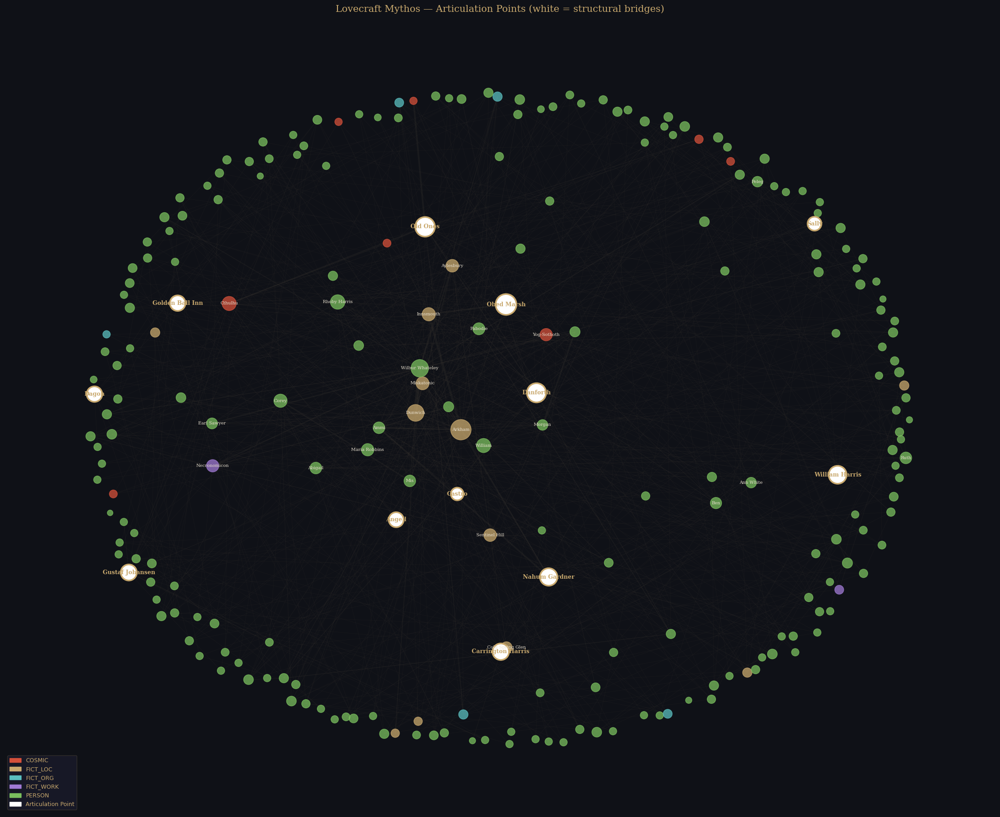

In [33]:
# Rebuild subgraph
min_degree = 3
subgraph_nodes = [n for n, d in G_clean.degree() if d >= min_degree]
H = G_clean.subgraph(subgraph_nodes).copy()

ap_set = set(articulation_points)

# Node visual properties
node_colors = []
node_sizes = []
node_borders = []

for node in H.nodes():
    entity_type = H.nodes[node].get('entity_type', 'unknown')
    deg = H.degree(node)
    
    if node in ap_set:
        node_colors.append('#ffffff')  # white — articulation points
        node_sizes.append(200 + deg * 40)
        node_borders.append(3.0)
    else:
        node_colors.append(color_map.get(entity_type, '#4a4540'))
        node_sizes.append(80 + deg * 20)
        node_borders.append(0.5)

edge_weights = [H[u][v]['weight'] for u, v in H.edges()]
edge_widths = [0.2 + w * 0.25 for w in edge_weights]

pos = nx.spring_layout(H, k=2.5, iterations=100, seed=42)

fig, ax = plt.subplots(figsize=(22, 18), facecolor='#0f1117')
ax.set_facecolor('#0f1117')

# Draw edges
nx.draw_networkx_edges(H, pos, ax=ax,
                       width=edge_widths,
                       alpha=0.25,
                       edge_color='#3a3530')

# Draw regular nodes
regular_nodes = [n for n in H.nodes() if n not in ap_set]
nx.draw_networkx_nodes(H, pos, ax=ax,
                       nodelist=regular_nodes,
                       node_color=[color_map.get(
                           H.nodes[n].get('entity_type','unknown'),
                           '#4a4540') for n in regular_nodes],
                       node_size=[80 + H.degree(n) * 20 for n in regular_nodes],
                       alpha=0.75)

# Draw articulation points on top — highlighted
nx.draw_networkx_nodes(H, pos, ax=ax,
                       nodelist=list(ap_set),
                       node_color='#ffffff',
                       node_size=[200 + H.degree(n) * 40 for n in ap_set],
                       alpha=1.0,
                       edgecolors='#c9a96e',
                       linewidths=2.5)

# Labels for articulation points always visible
nx.draw_networkx_labels(H, pos,
                        labels={n: n for n in ap_set},
                        ax=ax,
                        font_size=9,
                        font_color='#c9a96e',
                        font_family='serif',
                        font_weight='bold')

# Labels for other high degree nodes
high_degree = {n: n for n, d in H.degree() 
               if d >= 10 and n not in ap_set}
nx.draw_networkx_labels(H, pos,
                        labels=high_degree,
                        ax=ax,
                        font_size=7,
                        font_color='#e8e0d0',
                        font_family='serif')

# Legend
legend_patches = [mpatches.Patch(color=c, label=l) 
                  for l, c in color_map.items() if l != 'unknown']
legend_patches.append(mpatches.Patch(color='#ffffff', 
                                      label='Articulation Point'))
ax.legend(handles=legend_patches,
          loc='lower left',
          facecolor='#1a1a2a',
          edgecolor='#3a3530',
          labelcolor='#c9a96e',
          fontsize=9)

ax.set_title("Lovecraft Mythos — Articulation Points (white = structural bridges)",
             color='#c9a96e', fontsize=15, pad=20, fontfamily='serif')
ax.axis('off')

plt.tight_layout()
plt.savefig('lovecraft_articulation.png', dpi=150,
            bbox_inches='tight', facecolor='#0f1117')
plt.show()

In [34]:
import community as community_louvain

# Louvain community detection
partition = community_louvain.best_partition(H, weight='weight', random_state=42)

# How many communities?
n_communities = len(set(partition.values()))
print(f"Found {n_communities} communities\n")

# What's in each community?
from collections import defaultdict
communities = defaultdict(list)
for node, community_id in partition.items():
    communities[community_id].append(node)

for cid, members in sorted(communities.items()):
    # Get entity types and stories
    types = [H.nodes[n].get('entity_type', 'unknown') for n in members]
    stories = set()
    for n in members:
        stories.update(H.nodes[n].get('stories', set()))
    print(f"Community {cid} ({len(members)} members, stories: {stories}):")
    # Show highest degree members
    by_degree = sorted(members, key=lambda n: H.degree(n), reverse=True)
    for n in by_degree[:5]:
        print(f"  {n} ({H.nodes[n].get('entity_type','?')}): degree {H.degree(n)}")
    print()

Found 15 communities

Community 0 (43 members, stories: {'shadow_over_innsmouth', 'colour_out_of_space', 'at_the_mountains_of_madness', 'dunwich_horror'}):
  Wilbur Whateley (PERSON): degree 34
  Dunwich (FICT_LOC): degree 31
  Miskatonic (FICT_LOC): degree 17
  Aylesbury (FICT_LOC): degree 16
  Sentinel Hill (FICT_LOC): degree 16

Community 1 (6 members, stories: {'dunwich_horror'}):
  Blasphemies (PERSON): degree 5
  Azazel (PERSON): degree 5
  Buzrael (PERSON): degree 5
  Belial (PERSON): degree 5
  Ground (PERSON): degree 5

Community 2 (16 members, stories: {'dunwich_horror'}):
  Corey (PERSON): degree 18
  Mis (PERSON): degree 13
  Wizard Whateley'S (PERSON): degree 8
  Luther (PERSON): degree 7
  Sally (PERSON): degree 7

Community 3 (4 members, stories: {'shunned_house'}):
  Whipple (PERSON): degree 3
  Sidney S. Rider (PERSON): degree 3
  Thomas W. Bicknell (PERSON): degree 3
  Majesty (PERSON): degree 3

Community 4 (25 members, stories: {'shunned_house'}):
  William (PERSON)

/var/folders/wj/xzbvl19s7qdg2sxs_dz30hb80000gn/T/ipykernel_61186/860506791.py:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', n_comm)


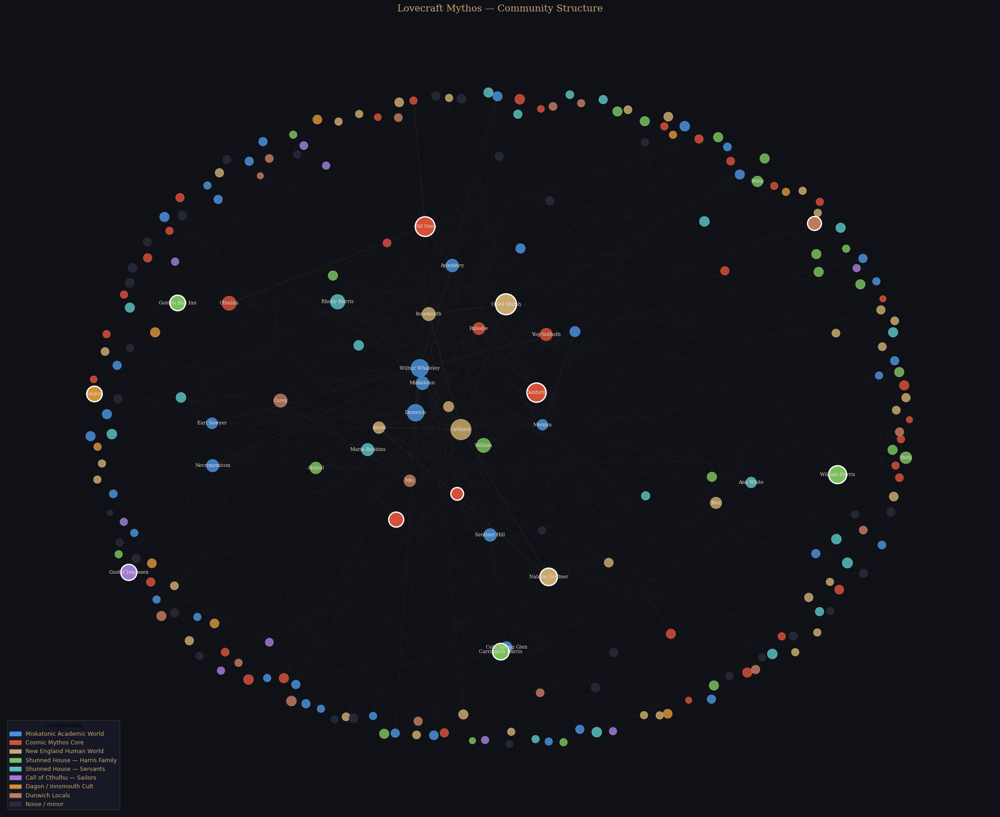

In [35]:
import matplotlib.cm as cm

# Assign colors to communities
n_comm = len(set(partition.values()))
cmap = cm.get_cmap('tab20', n_comm)
community_colors = {cid: cmap(cid) for cid in range(n_comm)}

# Highlight the meaningful communities
meaningful_communities = {
    0: ('Miskatonic Academic World', '#4a90d9'),
    8: ('Cosmic Mythos Core', '#d4503a'),
    9: ('New England Human World', '#c9a96e'),
    4: ('Shunned House — Harris Family', '#7abf5e'),
    5: ('Shunned House — Servants', '#5abfbf'),
    7: ('Call of Cthulhu — Sailors', '#a07ad4'),
    13: ('Dagon / Innsmouth Cult', '#d4903a'),
    2: ('Dunwich Locals', '#bf7a5e'),
}

# Build node colors from community
node_community_colors = []
for node in H.nodes():
    cid = partition[node]
    if cid in meaningful_communities:
        node_community_colors.append(meaningful_communities[cid][1])
    else:
        node_community_colors.append('#2a2a3a')  # noise — dark

node_sizes = [80 + H.degree(n) * 20 for n in H.nodes()]

# Articulation points get a white ring
ap_set = set(articulation_points)

pos = nx.spring_layout(H, k=2.5, iterations=100, seed=42)

fig, ax = plt.subplots(figsize=(22, 18), facecolor='#0f1117')
ax.set_facecolor('#0f1117')

# Edges
edge_weights = [H[u][v]['weight'] for u, v in H.edges()]
nx.draw_networkx_edges(H, pos, ax=ax,
                       width=[0.2 + w * 0.2 for w in edge_weights],
                       alpha=0.2,
                       edge_color='#3a3530')

# Regular nodes
nx.draw_networkx_nodes(H, pos, ax=ax,
                       node_color=node_community_colors,
                       node_size=node_sizes,
                       alpha=0.85)

# Articulation points — white ring
nx.draw_networkx_nodes(H, pos, ax=ax,
                       nodelist=list(ap_set),
                       node_color=[node_community_colors[list(H.nodes()).index(n)] 
                                   for n in ap_set],
                       node_size=[200 + H.degree(n) * 40 for n in ap_set],
                       edgecolors='#ffffff',
                       linewidths=2.0,
                       alpha=1.0)

# Labels for high degree nodes
high_degree = {n: n for n, d in H.degree() if d >= 10}
nx.draw_networkx_labels(H, pos,
                        labels=high_degree,
                        ax=ax,
                        font_size=7.5,
                        font_color='#e8e0d0',
                        font_family='serif')

# Legend for communities
legend_patches = [mpatches.Patch(color=color, label=name)
                  for cid, (name, color) in meaningful_communities.items()]
legend_patches.append(mpatches.Patch(color='#2a2a3a', label='Noise / minor'))
ax.legend(handles=legend_patches,
          loc='lower left',
          facecolor='#1a1a2a',
          edgecolor='#3a3530',
          labelcolor='#c9a96e',
          fontsize=9,
          title='Communities',
          title_fontsize=9)

ax.set_title("Lovecraft Mythos — Community Structure",
             color='#c9a96e', fontsize=15, pad=20,
             fontfamily='serif')
ax.axis('off')

plt.tight_layout()
plt.savefig('lovecraft_communities.png', dpi=150,
            bbox_inches='tight', facecolor='#0f1117')
plt.show()

TypeError: draw_networkx_nodes() got an unexpected keyword argument 'zorder'

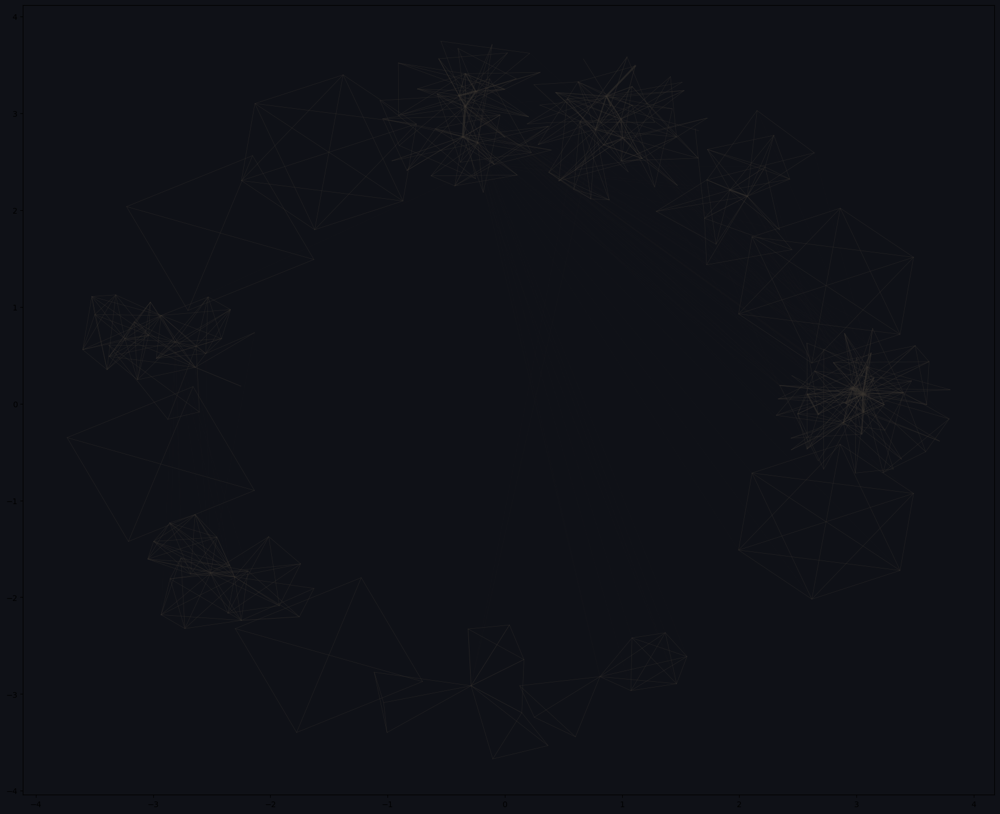

In [36]:
def community_layout(G, partition):
    # Step 1: build a community-level graph
    community_members = defaultdict(list)
    for node, cid in partition.items():
        community_members[cid].append(node)
    
    # Position community centers in a circle
    n_comm = len(community_members)
    comm_centers = {}
    for i, cid in enumerate(community_members.keys()):
        angle = 2 * np.pi * i / n_comm
        comm_centers[cid] = np.array([np.cos(angle) * 3, np.sin(angle) * 3])
    
    # Step 2: position nodes within each community
    # using spring layout around the community center
    pos = {}
    for cid, members in community_members.items():
        if len(members) == 1:
            pos[members[0]] = comm_centers[cid]
            continue
        subgraph = G.subgraph(members)
        sub_pos = nx.spring_layout(subgraph, k=1.5, seed=42)
        # Translate to community center
        center = comm_centers[cid]
        for node, p in sub_pos.items():
            pos[node] = p * 0.8 + center
    
    return pos

pos = community_layout(H, partition)

fig, ax = plt.subplots(figsize=(22, 18), facecolor='#0f1117')
ax.set_facecolor('#0f1117')

# Edges — draw inter-community edges fainter
for u, v in H.edges():
    cu, cv = partition[u], partition[v]
    alpha = 0.5 if cu == cv else 0.08
    weight = H[u][v]['weight']
    ax.plot([pos[u][0], pos[v][0]], 
            [pos[u][1], pos[v][1]],
            color='#3a3530', 
            alpha=alpha,
            linewidth=0.3 + weight * 0.2,
            zorder=1)

# Nodes
nx.draw_networkx_nodes(H, pos, ax=ax,
                       node_color=node_community_colors,
                       node_size=node_sizes,
                       alpha=0.88,
                       zorder=2)

# Articulation points
nx.draw_networkx_nodes(H, pos, ax=ax,
                       nodelist=list(ap_set),
                       node_color=[node_community_colors[list(H.nodes()).index(n)] 
                                   for n in ap_set],
                       node_size=[200 + H.degree(n) * 40 for n in ap_set],
                       edgecolors='#ffffff',
                       linewidths=2.0,
                       alpha=1.0,
                       zorder=3)

# Labels for high degree nodes
high_degree = {n: n for n, d in H.degree() if d >= 10}
nx.draw_networkx_labels(H, pos,
                        labels=high_degree,
                        ax=ax,
                        font_size=7.5,
                        font_color='#e8e0d0',
                        font_family='serif',
                        zorder=4)

# Community name labels at cluster centers
community_centers = defaultdict(list)
for node, p in pos.items():
    cid = partition[node]
    community_centers[cid].append(p)

for cid, (name, color) in meaningful_communities.items():
    if cid in community_centers:
        center = np.mean(community_centers[cid], axis=0)
        ax.text(center[0], center[1] + 0.9,
                name,
                ha='center', va='center',
                color=color,
                fontsize=8,
                fontfamily='serif',
                fontstyle='italic',
                alpha=0.9,
                zorder=5)

# Legend
legend_patches = [mpatches.Patch(color=color, label=name)
                  for cid, (name, color) in meaningful_communities.items()]
legend_patches.append(mpatches.Patch(color='#2a2a3a', label='Noise / minor'))
ax.legend(handles=legend_patches,
          loc='lower left',
          facecolor='#1a1a2a',
          edgecolor='#3a3530',
          labelcolor='#c9a96e',
          fontsize=9,
          title='Communities',
          title_fontsize=9)

ax.set_title("Lovecraft Mythos — Community Structure",
             color='#c9a96e', fontsize=15, pad=20,
             fontfamily='serif')
ax.axis('off')

plt.tight_layout()
plt.savefig('lovecraft_communities.png', dpi=150,
            bbox_inches='tight', facecolor='#0f1117')
plt.show()

TypeError: draw_networkx_nodes() got an unexpected keyword argument 'zorder'

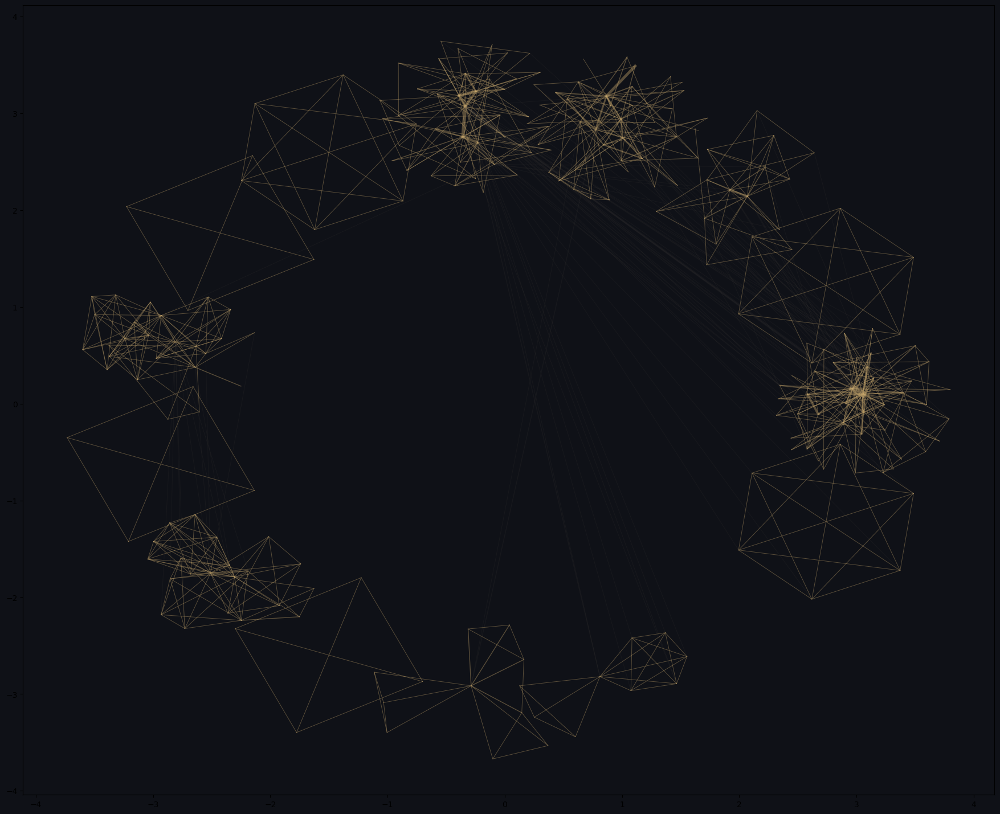

In [37]:
pos = community_layout(H, partition)

fig, ax = plt.subplots(figsize=(22, 18), facecolor='#0f1117')
ax.set_facecolor('#0f1117')

# Edges — intra brighter, inter visible but faint
for u, v in H.edges():
    cu, cv = partition[u], partition[v]
    same = cu == cv
    weight = H[u][v]['weight']
    ax.plot([pos[u][0], pos[v][0]],
            [pos[u][1], pos[v][1]],
            color='#c9a96e' if same else '#4a4540',
            alpha=0.4 if same else 0.15,
            linewidth=0.4 + weight * 0.3,
            zorder=1)

# All nodes — larger, brighter
node_list = list(H.nodes())
node_colors_bright = []
for node in node_list:
    cid = partition[node]
    if cid in meaningful_communities:
        node_colors_bright.append(meaningful_communities[cid][1])
    else:
        node_colors_bright.append('#5a5560')  # visible grey for noise

node_sizes_large = [150 + H.degree(n) * 35 for n in node_list]

nx.draw_networkx_nodes(H, pos, ax=ax,
                       nodelist=node_list,
                       node_color=node_colors_bright,
                       node_size=node_sizes_large,
                       alpha=0.9,
                       zorder=2)

# Articulation points — white ring
nx.draw_networkx_nodes(H, pos, ax=ax,
                       nodelist=list(ap_set),
                       node_color=[node_colors_bright[node_list.index(n)] 
                                   for n in ap_set],
                       node_size=[300 + H.degree(n) * 50 for n in ap_set],
                       edgecolors='#ffffff',
                       linewidths=2.5,
                       alpha=1.0,
                       zorder=3)

# Labels — high degree nodes
high_degree = {n: n for n, d in H.degree() if d >= 8}
nx.draw_networkx_labels(H, pos,
                        labels=high_degree,
                        ax=ax,
                        font_size=8,
                        font_color='#ffffff',
                        font_family='serif',
                        zorder=4)

# Community name labels
community_centers = defaultdict(list)
for node, p in pos.items():
    cid = partition[node]
    community_centers[cid].append(p)

for cid, (name, color) in meaningful_communities.items():
    if cid in community_centers:
        center = np.mean(community_centers[cid], axis=0)
        ax.text(center[0], center[1] + 1.1,
                name,
                ha='center', va='center',
                color=color,
                fontsize=9,
                fontfamily='serif',
                fontstyle='italic',
                fontweight='bold',
                alpha=1.0,
                zorder=5)

# Legend
legend_patches = [mpatches.Patch(color=color, label=name)
                  for cid, (name, color) in meaningful_communities.items()]
legend_patches.append(mpatches.Patch(color='#5a5560', label='Noise / minor'))
ax.legend(handles=legend_patches,
          loc='lower left',
          facecolor='#1a1a2a',
          edgecolor='#3a3530',
          labelcolor='#e8e0d0',
          fontsize=9,
          title='Communities',
          title_fontsize=9)

ax.set_title("Lovecraft Mythos — Community Structure",
             color='#c9a96e', fontsize=15, pad=20,
             fontfamily='serif')
ax.axis('off')

plt.tight_layout()
plt.savefig('lovecraft_communities.png', dpi=150,
            bbox_inches='tight', facecolor='#0f1117')
plt.show()

In [38]:
# Diagnostic — check what positions and sizes we're actually working with
print(f"Number of nodes in H: {H.number_of_nodes()}")
print(f"Number of pos entries: {len(pos)}")
print(f"Sample positions:")
for node in list(H.nodes())[:5]:
    print(f"  {node}: {pos.get(node, 'MISSING')}")

print(f"\nSample node sizes: {node_sizes_large[:5]}")
print(f"Sample colors: {node_colors_bright[:5]}")

# Check position range
x_vals = [p[0] for p in pos.values()]
y_vals = [p[1] for p in pos.values()]
print(f"\nPosition range:")
print(f"  x: {min(x_vals):.2f} to {max(x_vals):.2f}")
print(f"  y: {min(y_vals):.2f} to {max(y_vals):.2f}")

Number of nodes in H: 234
Number of pos entries: 234
Sample positions:
  Aylesbury: [ 3.06182203 -0.08723957]
  Miskatonic: [3.39877073 0.11363385]
  Dunwich: [2.96806688 0.15845968]
  Blasphemies: [2.86190415 2.02016379]
  Azazel: [1.99415463 0.92753563]

Sample node sizes: [710, 745, 1235, 325, 325]
Sample colors: ['#4a90d9', '#4a90d9', '#4a90d9', '#5a5560', '#5a5560']

Position range:
  x: -3.73 to 3.80
  y: -3.67 to 3.75


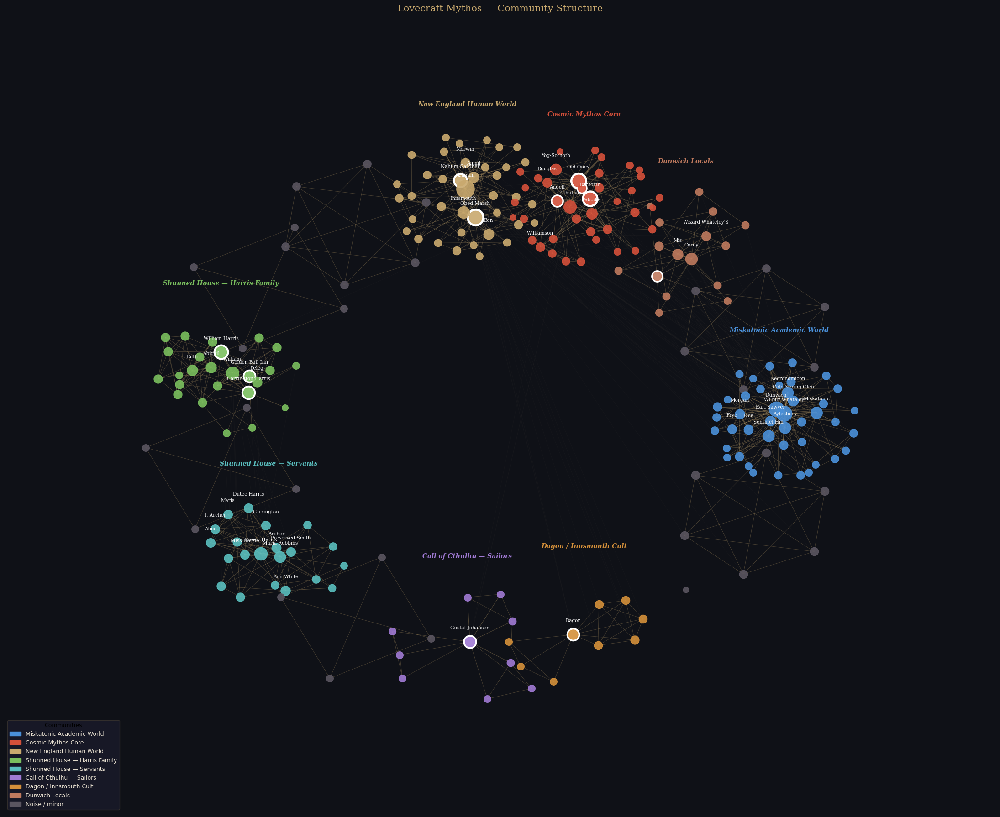

In [39]:
pos = community_layout(H, partition)
node_list = list(H.nodes())

fig, ax = plt.subplots(figsize=(22, 18), facecolor='#0f1117')
ax.set_facecolor('#0f1117')

# Draw edges first
for u, v in H.edges():
    cu, cv = partition[u], partition[v]
    same = cu == cv
    weight = H[u][v]['weight']
    ax.plot([pos[u][0], pos[v][0]],
            [pos[u][1], pos[v][1]],
            color='#c9a96e' if same else '#4a4540',
            alpha=0.35 if same else 0.12,
            linewidth=0.3 + weight * 0.25,
            zorder=1)

# Draw nodes with scatter — full control
for node in node_list:
    cid = partition[node]
    color = meaningful_communities[cid][1] if cid in meaningful_communities else '#5a5560'
    size = 80 + H.degree(node) * 15
    x, y = pos[node]
    
    # White ring for articulation points
    if node in ap_set:
        ax.scatter(x, y, s=size * 1.8, color='white', zorder=3, alpha=1.0)
    
    ax.scatter(x, y, s=size, color=color, zorder=4, alpha=0.9)

# Labels for high degree nodes
for node, degree in H.degree():
    if degree >= 8:
        x, y = pos[node]
        ax.text(x, y + 0.15, node,
                ha='center', va='bottom',
                color='#ffffff',
                fontsize=7.5,
                fontfamily='serif',
                zorder=5)

# Community name labels
community_centers = defaultdict(list)
for node, p in pos.items():
    cid = partition[node]
    community_centers[cid].append(p)

for cid, (name, color) in meaningful_communities.items():
    if cid in community_centers:
        center = np.mean(community_centers[cid], axis=0)
        ax.text(center[0], center[1] + 1.2,
                name,
                ha='center', va='center',
                color=color,
                fontsize=10,
                fontfamily='serif',
                fontstyle='italic',
                fontweight='bold',
                zorder=6)

# Legend
legend_patches = [mpatches.Patch(color=color, label=name)
                  for cid, (name, color) in meaningful_communities.items()]
legend_patches.append(mpatches.Patch(color='#5a5560', label='Noise / minor'))
ax.legend(handles=legend_patches,
          loc='lower left',
          facecolor='#1a1a2a',
          edgecolor='#3a3530',
          labelcolor='#e8e0d0',
          fontsize=9,
          title='Communities',
          title_fontsize=9)

ax.set_title("Lovecraft Mythos — Community Structure",
             color='#c9a96e', fontsize=15, pad=20,
             fontfamily='serif')
ax.axis('off')
ax.set_xlim(min(x_vals) - 1.5, max(x_vals) + 1.5)
ax.set_ylim(min(y_vals) - 1.5, max(y_vals) + 1.5)

plt.tight_layout()
plt.savefig('lovecraft_communities.png', dpi=150,
            bbox_inches='tight', facecolor='#0f1117')
plt.show()

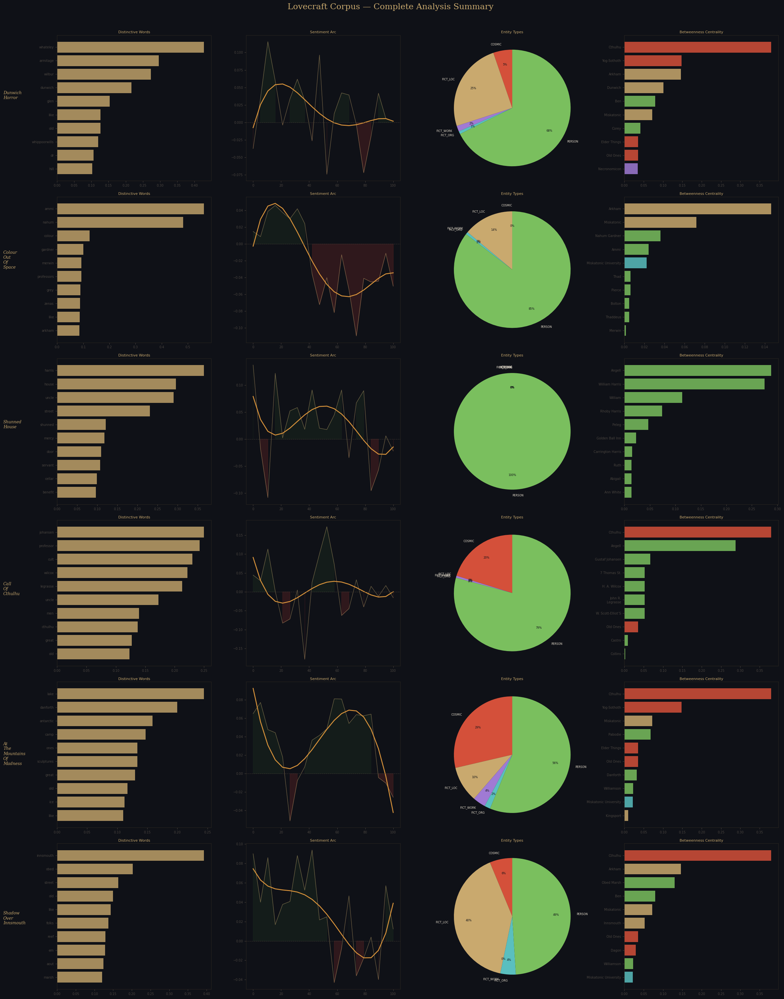

Summary saved.


In [40]:
fig, axes = plt.subplots(6, 4, figsize=(24, 30), facecolor='#0f1117')

for row, title in enumerate(titles):
    text = clean_texts[title]
    words = text.split()
    
    # --- Panel 1: TF-IDF word fingerprint ---
    ax = axes[row][0]
    ax.set_facecolor('#0f1117')
    scores = tfidf_matrix[titles.index(title)].toarray()[0]
    word_scores = {feature_names[j]: scores[j] 
                   for j in range(len(scores)) if scores[j] > 0}
    top_words = sorted(word_scores.items(), 
                       key=lambda x: x[1], reverse=True)[:10]
    words_list, score_list = zip(*top_words)
    bars = ax.barh(range(len(words_list)), score_list, color='#c9a96e', alpha=0.8)
    ax.set_yticks(range(len(words_list)))
    ax.set_yticklabels(words_list, color='#e8e0d0', fontsize=7)
    ax.invert_yaxis()
    ax.set_title('Distinctive Words', color='#c9a96e', fontsize=8, pad=4)
    for spine in ax.spines.values():
        spine.set_edgecolor('#2a2520')
    ax.tick_params(colors='#4a4540', labelsize=7)

    # --- Panel 2: Sentiment arc ---
    ax = axes[row][1]
    ax.set_facecolor('#0f1117')
    sentiment_scores = arcs[title]
    x = np.linspace(0, 100, len(sentiment_scores))
    ax.plot(x, sentiment_scores, color='#c9a96e', linewidth=1, alpha=0.5)
    coeffs = np.polyfit(x, sentiment_scores, 4)
    smooth = np.polyval(coeffs, x)
    ax.plot(x, smooth, color='#d4903a', linewidth=2)
    ax.axhline(y=0, color='#3a3530', linewidth=0.8, linestyle='--')
    ax.fill_between(x, sentiment_scores, 0,
                    where=[s < 0 for s in sentiment_scores],
                    color='#7a2a2a', alpha=0.3)
    ax.fill_between(x, sentiment_scores, 0,
                    where=[s >= 0 for s in sentiment_scores],
                    color='#2a4a2a', alpha=0.2)
    ax.set_title('Sentiment Arc', color='#c9a96e', fontsize=8, pad=4)
    for spine in ax.spines.values():
        spine.set_edgecolor('#2a2520')
    ax.tick_params(colors='#4a4540', labelsize=7)

    # --- Panel 3: Entity composition ---
    ax = axes[row][2]
    ax.set_facecolor('#0f1117')
    entity_counts = {}
    for label in ['COSMIC', 'FICT_LOC', 'FICT_WORK', 'FICT_ORG', 'PERSON']:
        entities = story_entities_v2[title].get(label, [])
        entity_counts[label] = len(entities)
    
    labels = list(entity_counts.keys())
    counts = list(entity_counts.values())
    colors_e = [color_map.get(l, '#4a4540') for l in labels]
    
    if sum(counts) > 0:
        wedges, texts, autotexts = ax.pie(
            counts, labels=labels, colors=colors_e,
            autopct='%1.0f%%', startangle=90,
            textprops={'color': '#e8e0d0', 'fontsize': 6},
            pctdistance=0.75
        )
        for at in autotexts:
            at.set_color('#0f1117')
            at.set_fontsize(6)
    ax.set_title('Entity Types', color='#c9a96e', fontsize=8, pad=4)

    # --- Panel 4: Network centrality ---
    ax = axes[row][3]
    ax.set_facecolor('#0f1117')
    
    # Get nodes belonging to this story
    story_nodes = [n for n in H.nodes() 
                   if title in H.nodes[n].get('stories', set())]
    
    if story_nodes:
        story_df = df[df['entity'].isin(story_nodes)].nlargest(10, 'betweenness')
        colors_n = [color_map.get(t, '#4a4540') for t in story_df['type']]
        ax.barh(range(len(story_df)), 
                story_df['betweenness'], 
                color=colors_n, alpha=0.85)
        ax.set_yticks(range(len(story_df)))
        ax.set_yticklabels(story_df['entity'], 
                          color='#e8e0d0', fontsize=7)
        ax.invert_yaxis()
    ax.set_title('Betweenness Centrality', color='#c9a96e', fontsize=8, pad=4)
    for spine in ax.spines.values():
        spine.set_edgecolor('#2a2520')
    ax.tick_params(colors='#4a4540', labelsize=7)

    # Row label
    fig.text(0.01, 
             1 - (row + 0.5) / 6,
             title.replace('_', '\n').title(),
             va='center', ha='left',
             color='#c9a96e', fontsize=9,
             fontfamily='serif',
             fontstyle='italic')

plt.suptitle("Lovecraft Corpus — Complete Analysis Summary",
             color='#c9a96e', fontsize=18, y=1.01,
             fontfamily='serif')

plt.tight_layout(rect=[0.04, 0, 1, 1])
plt.savefig('lovecraft_summary.png', dpi=150,
            bbox_inches='tight', facecolor='#0f1117')
plt.show()

print("Summary saved.")

Ego network for 'Cthulhu' (radius=2):
  Nodes: 124
  Edges: 317


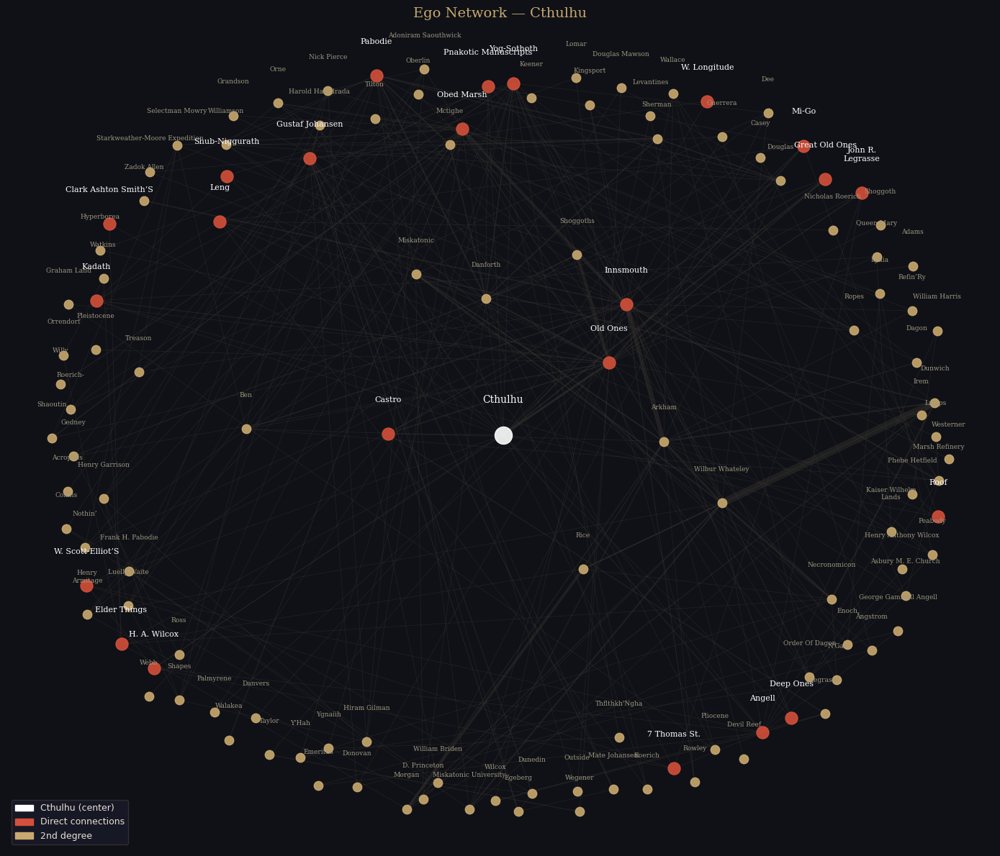

In [41]:
def plot_ego_network(G, entity, radius=2):
    # Get ego network — all nodes within 'radius' steps
    ego = nx.ego_graph(G, entity, radius=radius, undirected=True)
    
    print(f"Ego network for '{entity}' (radius={radius}):")
    print(f"  Nodes: {ego.number_of_nodes()}")
    print(f"  Edges: {ego.number_of_edges()}")
    
    # Distance from center
    distances = nx.single_source_shortest_path_length(ego, entity)
    
    # Layout — entity at center
    pos = nx.spring_layout(ego, k=2.0, seed=42)
    pos[entity] = np.array([0, 0])  # force center
    
    fig, ax = plt.subplots(figsize=(14, 12), facecolor='#0f1117')
    ax.set_facecolor('#0f1117')
    
    # Color by distance
    ring_colors = {0: '#ffffff', 1: '#d4503a', 2: '#c9a96e'}
    
    # Edges
    for u, v in ego.edges():
        weight = ego[u][v]['weight']
        ax.plot([pos[u][0], pos[v][0]],
                [pos[u][1], pos[v][1]],
                color='#3a3530',
                alpha=0.4,
                linewidth=0.3 + weight * 0.3,
                zorder=1)
    
    # Nodes by ring
    for node in ego.nodes():
        dist = distances.get(node, 2)
        color = ring_colors.get(dist, '#c9a96e')
        size = 300 if dist == 0 else (150 if dist == 1 else 80)
        x, y = pos[node]
        ax.scatter(x, y, s=size, color=color, zorder=3, alpha=0.9)
        
        # Labels
        fontsize = 10 if dist == 0 else (8 if dist == 1 else 6.5)
        ax.text(x, y + 0.08, node,
                ha='center', va='bottom',
                color='#ffffff' if dist < 2 else '#a09880',
                fontsize=fontsize,
                fontfamily='serif',
                zorder=4)
    
    # Ring legend
    legend_patches = [
        mpatches.Patch(color='#ffffff', label=f'{entity} (center)'),
        mpatches.Patch(color='#d4503a', label='Direct connections'),
        mpatches.Patch(color='#c9a96e', label='2nd degree'),
    ]
    ax.legend(handles=legend_patches,
              loc='lower left',
              facecolor='#1a1a2a',
              edgecolor='#3a3530',
              labelcolor='#e8e0d0',
              fontsize=9)
    
    ax.set_title(f"Ego Network — {entity}",
                 color='#c9a96e', fontsize=14,
                 fontfamily='serif', pad=15)
    ax.axis('off')
    plt.tight_layout()
    plt.savefig(f'ego_{entity.replace(" ", "_")}.png', 
                dpi=150, bbox_inches='tight', facecolor='#0f1117')
    plt.show()

# Start with Cthulhu
plot_ego_network(G_clean, 'Cthulhu', radius=2)

In [42]:
def find_path(G, source, target):
    try:
        path = nx.shortest_path(G, source, target, weight='weight')
        print(f"\nShortest path: {source} → {target}")
        print(f"  Length: {len(path)-1} steps")
        print(f"  Path: {' → '.join(path)}")
        
        # Edge weights along path
        print(f"  Edge weights:")
        for i in range(len(path)-1):
            w = G[path[i]][path[i+1]]['weight']
            print(f"    {path[i]} ↔ {path[i+1]}: {w} co-occurrences")
    except nx.NetworkXNoPath:
        print(f"No path found between {source} and {target}")

# The unexpected pairs
find_path(G_clean, 'Rhoby Harris', 'Cthulhu')
find_path(G_clean, 'Ann White', 'Yog-Sothoth')
find_path(G_clean, 'Necronomicon', 'Gustaf Johansen')


Shortest path: Rhoby Harris → Cthulhu
  Length: 4 steps
  Path: Rhoby Harris → William → William Harris → Angell → Cthulhu
  Edge weights:
    Rhoby Harris ↔ William: 1 co-occurrences
    William ↔ William Harris: 1 co-occurrences
    William Harris ↔ Angell: 1 co-occurrences
    Angell ↔ Cthulhu: 2 co-occurrences

Shortest path: Ann White → Yog-Sothoth
  Length: 5 steps
  Path: Ann White → William → William Harris → Angell → Cthulhu → Yog-Sothoth
  Edge weights:
    Ann White ↔ William: 1 co-occurrences
    William ↔ William Harris: 1 co-occurrences
    William Harris ↔ Angell: 1 co-occurrences
    Angell ↔ Cthulhu: 2 co-occurrences
    Cthulhu ↔ Yog-Sothoth: 1 co-occurrences

Shortest path: Necronomicon → Gustaf Johansen
  Length: 3 steps
  Path: Necronomicon → Yog-Sothoth → Cthulhu → Gustaf Johansen
  Edge weights:
    Necronomicon ↔ Yog-Sothoth: 1 co-occurrences
    Yog-Sothoth ↔ Cthulhu: 1 co-occurrences
    Cthulhu ↔ Gustaf Johansen: 2 co-occurrences


In [43]:
# Cross-story pairs with no obvious connection
pairs = [
    ('Nahum Gardner', 'Wilbur Whateley'),   # farmer vs monster
    ('Rhoby Harris', 'Necronomicon'),        # colonial housewife vs forbidden text
    ('Ann White', 'Dagon'),                  # servant vs sea god
    ('Ammi Pierce', 'Yog-Sothoth'),          # rural neighbour vs cosmic deity
    ('Danforth', 'Obed Marsh'),              # antarctic explorer vs cult founder
]

for source, target in pairs:
    find_path(G_clean, source, target)
    print()


Shortest path: Nahum Gardner → Wilbur Whateley
  Length: 3 steps
  Path: Nahum Gardner → Miskatonic → Olaus Wormius' → Wilbur Whateley
  Edge weights:
    Nahum Gardner ↔ Miskatonic: 1 co-occurrences
    Miskatonic ↔ Olaus Wormius': 1 co-occurrences
    Olaus Wormius' ↔ Wilbur Whateley: 1 co-occurrences


Shortest path: Rhoby Harris → Necronomicon
  Length: 6 steps
  Path: Rhoby Harris → William → William Harris → Angell → Cthulhu → Yog-Sothoth → Necronomicon
  Edge weights:
    Rhoby Harris ↔ William: 1 co-occurrences
    William ↔ William Harris: 1 co-occurrences
    William Harris ↔ Angell: 1 co-occurrences
    Angell ↔ Cthulhu: 2 co-occurrences
    Cthulhu ↔ Yog-Sothoth: 1 co-occurrences
    Yog-Sothoth ↔ Necronomicon: 1 co-occurrences


Shortest path: Ann White → Dagon
  Length: 6 steps
  Path: Ann White → William → William Harris → Angell → Cthulhu → Obed Marsh → Dagon
  Edge weights:
    Ann White ↔ William: 1 co-occurrences
    William ↔ William Harris: 1 co-occurrences
    Wi

NodeNotFound: Source Ammi Pierce is not in G

In [44]:
# Check which names are actually in G_clean
test_names = ['Nahum Gardner', 'Wilbur Whateley', 'Rhoby Harris', 
              'Necronomicon', 'Ann White', 'Dagon', 'Ammi Pierce',
              'Yog-Sothoth', 'Danforth', 'Obed Marsh', 'Ammi']

for name in test_names:
    in_graph = name in G_clean
    in_H = name in H
    print(f"  {name}: G_clean={in_graph}, H={in_H}")

  Nahum Gardner: G_clean=True, H=True
  Wilbur Whateley: G_clean=True, H=True
  Rhoby Harris: G_clean=True, H=True
  Necronomicon: G_clean=True, H=True
  Ann White: G_clean=True, H=True
  Dagon: G_clean=True, H=True
  Ammi Pierce: G_clean=False, H=False
  Yog-Sothoth: G_clean=True, H=True
  Danforth: G_clean=True, H=True
  Obed Marsh: G_clean=True, H=True
  Ammi: G_clean=True, H=True


In [45]:
pairs = [
    ('Nahum Gardner', 'Wilbur Whateley'),   # farmer vs monster
    ('Rhoby Harris', 'Necronomicon'),        # colonial housewife vs forbidden text
    ('Ann White', 'Dagon'),                  # servant vs sea god
    ('Ammi', 'Yog-Sothoth'),                 # rural neighbour vs cosmic deity
    ('Danforth', 'Obed Marsh'),              # antarctic explorer vs cult founder
]

for source, target in pairs:
    find_path(G_clean, source, target)
    print()


Shortest path: Nahum Gardner → Wilbur Whateley
  Length: 3 steps
  Path: Nahum Gardner → Miskatonic → Olaus Wormius' → Wilbur Whateley
  Edge weights:
    Nahum Gardner ↔ Miskatonic: 1 co-occurrences
    Miskatonic ↔ Olaus Wormius': 1 co-occurrences
    Olaus Wormius' ↔ Wilbur Whateley: 1 co-occurrences


Shortest path: Rhoby Harris → Necronomicon
  Length: 6 steps
  Path: Rhoby Harris → William → William Harris → Angell → Cthulhu → Yog-Sothoth → Necronomicon
  Edge weights:
    Rhoby Harris ↔ William: 1 co-occurrences
    William ↔ William Harris: 1 co-occurrences
    William Harris ↔ Angell: 1 co-occurrences
    Angell ↔ Cthulhu: 2 co-occurrences
    Cthulhu ↔ Yog-Sothoth: 1 co-occurrences
    Yog-Sothoth ↔ Necronomicon: 1 co-occurrences


Shortest path: Ann White → Dagon
  Length: 6 steps
  Path: Ann White → William → William Harris → Angell → Cthulhu → Obed Marsh → Dagon
  Edge weights:
    Ann White ↔ William: 1 co-occurrences
    William ↔ William Harris: 1 co-occurrences
    Wi

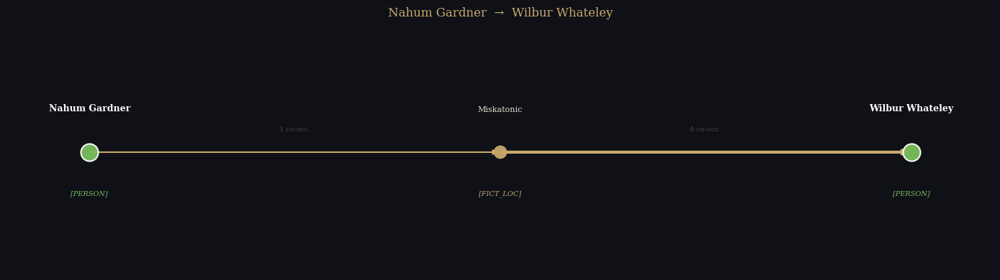

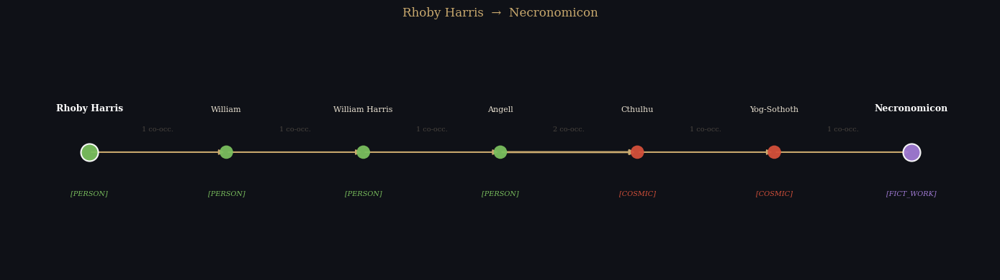

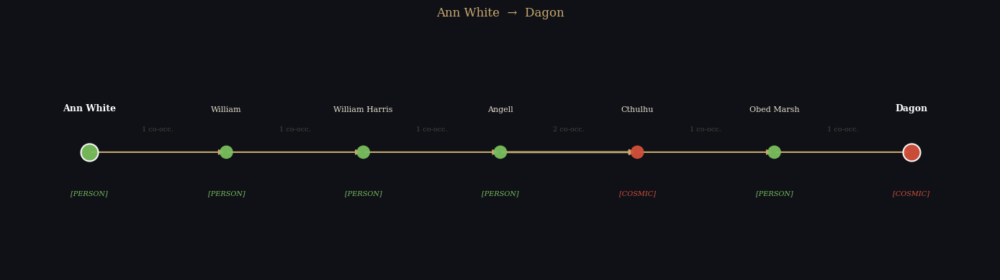

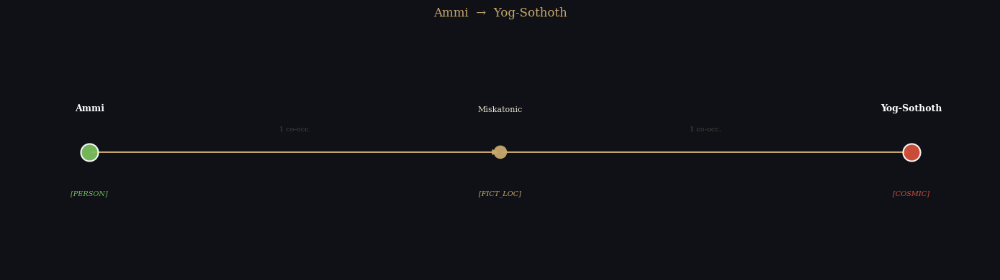

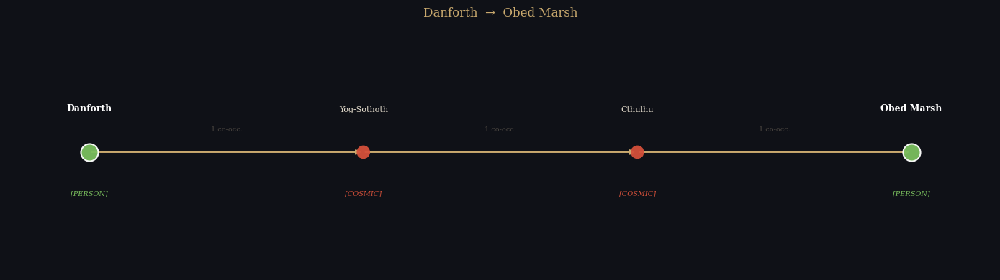

In [46]:
def plot_path(G, source, target, title=None):
    try:
        path = nx.shortest_path(G, source, target)
    except (nx.NodeNotFound, nx.NetworkXNoPath) as e:
        print(f"Could not find path: {e}")
        return

    fig, ax = plt.subplots(figsize=(14, 4), facecolor='#0f1117')
    ax.set_facecolor('#0f1117')

    # Layout — evenly spaced horizontal chain
    n = len(path)
    positions = {node: np.array([i / (n-1), 0.5]) for i, node in enumerate(path)}

    # Draw edges
    for i in range(len(path)-1):
        u, v = path[i], path[i+1]
        x0, y0 = positions[u]
        x1, y1 = positions[v]
        weight = G[u][v]['weight']
        ax.annotate("",
                    xy=(x1, y1), xytext=(x0, y0),
                    arrowprops=dict(
                        arrowstyle="-|>",
                        color='#c9a96e',
                        lw=1.0 + weight * 0.5,
                        connectionstyle="arc3,rad=0.0"
                    ))
        # Edge weight label
        mx, my = (x0+x1)/2, 0.5
        ax.text(mx, my + 0.08, f"{weight} co-occ.",
                ha='center', va='bottom',
                color='#4a4540', fontsize=7,
                fontfamily='serif')

    # Draw nodes
    for i, node in enumerate(path):
        x, y = positions[node]
        entity_type = G.nodes[node].get('entity_type', 'unknown')
        color = color_map.get(entity_type, '#4a4540')

        # First and last nodes larger
        size = 300 if (i == 0 or i == n-1) else 180
        ax.scatter(x, y, s=size, color=color,
                  zorder=4, alpha=0.95,
                  edgecolors='#ffffff' if (i==0 or i==n-1) else 'none',
                  linewidths=1.5)

        # Node label above
        ax.text(x, y + 0.16, node,
                ha='center', va='bottom',
                color='#ffffff' if (i==0 or i==n-1) else '#e8e0d0',
                fontsize=9 if (i==0 or i==n-1) else 8,
                fontfamily='serif',
                fontweight='bold' if (i==0 or i==n-1) else 'normal')

        # Entity type below
        ax.text(x, y - 0.16, f"[{entity_type}]",
                ha='center', va='top',
                color=color,
                fontsize=7,
                fontfamily='serif',
                fontstyle='italic')

    ax.set_xlim(-0.1, 1.1)
    ax.set_ylim(0, 1)
    ax.axis('off')

    title = title or f"{source}  →  {target}"
    ax.set_title(title, color='#c9a96e', fontsize=12,
                fontfamily='serif', pad=15)

    plt.tight_layout()
    fname = f"path_{source.replace(' ','_')}_{target.replace(' ','_')}.png"
    plt.savefig(fname, dpi=150, bbox_inches='tight', facecolor='#0f1117')
    plt.show()

# Plot all pairs
pairs = [
    ('Nahum Gardner', 'Wilbur Whateley'),
    ('Rhoby Harris', 'Necronomicon'),
    ('Ann White', 'Dagon'),
    ('Ammi', 'Yog-Sothoth'),
    ('Danforth', 'Obed Marsh'),
]

for source, target in pairs:
    plot_path(G_clean, source, target)

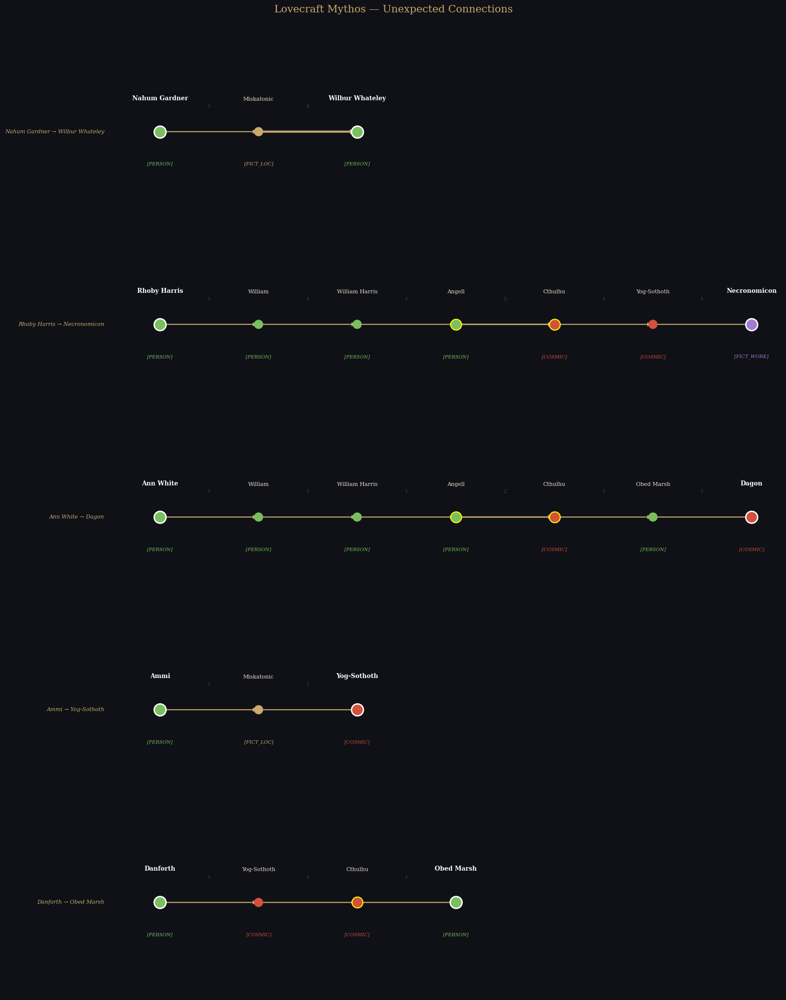

In [47]:
pairs = [
    ('Nahum Gardner', 'Wilbur Whateley'),
    ('Rhoby Harris', 'Necronomicon'),
    ('Ann White', 'Dagon'),
    ('Ammi', 'Yog-Sothoth'),
    ('Danforth', 'Obed Marsh'),
]

# Find all paths first to determine max length
paths = []
for source, target in pairs:
    try:
        path = nx.shortest_path(G_clean, source, target)
        paths.append((source, target, path))
    except:
        pass

max_len = max(len(p) for _, _, p in paths)

fig, axes = plt.subplots(len(paths), 1, 
                          figsize=(16, 4 * len(paths)),
                          facecolor='#0f1117')

for ax, (source, target, path) in zip(axes, paths):
    ax.set_facecolor('#0f1117')
    n = len(path)
    
    # Align to max length — pad positions so longer paths fill the space
    positions = {node: np.array([i / (max_len - 1), 0.5]) 
                 for i, node in enumerate(path)}

    # Edges
    for i in range(n - 1):
        u, v = path[i], path[i+1]
        x0, y0 = positions[u]
        x1, y1 = positions[v]
        weight = G_clean[u][v]['weight']
        ax.annotate("",
                    xy=(x1, y1), xytext=(x0, y0),
                    arrowprops=dict(
                        arrowstyle="-|>",
                        color='#c9a96e',
                        lw=1.0 + weight * 0.5,
                    ))
        mx = (x0 + x1) / 2
        ax.text(mx, 0.5 + 0.1, f"{weight}",
                ha='center', va='bottom',
                color='#4a4540', fontsize=7,
                fontfamily='serif')

    # Nodes
    for i, node in enumerate(path):
        x, y = positions[node]
        entity_type = G_clean.nodes[node].get('entity_type', 'unknown')
        color = color_map.get(entity_type, '#4a4540')
        is_endpoint = (i == 0 or i == n - 1)
        is_bridge = (node == 'Angell' or node == 'Cthulhu')

        size = 300 if is_endpoint else (250 if is_bridge else 180)
        edge_color = '#ffffff' if is_endpoint else ('#ffff00' if is_bridge else 'none')
        lw = 2.0 if is_endpoint else (1.5 if is_bridge else 0)

        ax.scatter(x, y, s=size, color=color, zorder=4,
                  edgecolors=edge_color, linewidths=lw)

        ax.text(x, y + 0.13, node,
                ha='center', va='bottom',
                color='#ffffff' if is_endpoint else '#e8e0d0',
                fontsize=9 if is_endpoint else 8,
                fontfamily='serif',
                fontweight='bold' if is_endpoint else 'normal')

        ax.text(x, y - 0.13, f"[{entity_type}]",
                ha='center', va='top',
                color=color, fontsize=7,
                fontfamily='serif', fontstyle='italic')

    ax.set_xlim(-0.05, 1.05)
    ax.set_ylim(0.1, 0.9)
    ax.axis('off')

    # Path label on left
    ax.text(-0.04, 0.5, f"{source} → {target}",
            ha='right', va='center',
            color='#c9a96e', fontsize=8,
            fontfamily='serif', fontstyle='italic',
            transform=ax.transAxes)

plt.suptitle("Lovecraft Mythos — Unexpected Connections",
             color='#c9a96e', fontsize=15,
             fontfamily='serif', y=1.01)

plt.tight_layout()
plt.savefig('lovecraft_paths.png', dpi=150,
            bbox_inches='tight', facecolor='#0f1117')
plt.show()

In [53]:
from collections import defaultdict
import random

def build_markov_chain(texts, order=2):
    # Order 2 means we look at 2 words to predict the next
    chain = defaultdict(list)
    
    # Combine all texts into one Lovecraftian mass
    full_text = ' '.join(texts.values())
    words = full_text.split()
    
    for i in range(len(words) - order):
        key = tuple(words[i:i+order])
        next_word = words[i+order]
        chain[key].append(next_word)
    
    return chain, words

def generate_text(chain, words, order=2, length=100, seed=None):
    if seed:
        random.seed(seed)
    
    # Start from a random point in the text
    start = random.randint(0, len(words) - order)
    current = tuple(words[start:start+order])
    
    result = list(current)
    
    for _ in range(length):
        if current in chain:
            next_word = random.choice(chain[current])
            result.append(next_word)
            current = tuple(result[-order:])
        else:
            break
    
    return ' '.join(result)

# Build the chain
chain, words = build_markov_chain(clean_texts, order=3)
print(f"Chain built: {len(chain):,} unique bigram states\n")

# Generate a few passages
print("=== GENERATED LOVECRAFT ===\n")
for i in range(3):
    print(f"--- Passage {i+1} ---")
    print(generate_text(chain, words, order=3, length=80))
    print()

Chain built: 111,520 unique bigram states

=== GENERATED LOVECRAFT ===

--- Passage 1 ---
returned the next morning and start back for our old base as soon as they knew of its presence, and which they mentioned only with shudders, saying that it had showed a certain mistiness around the altar-stone on the distant reef. They were definite and unmistakable, and awaked in my mind and made me wish I had accompanied the party. “10:05 P.M. On the wing. After snowstorm, have spied mountain-range ahead higher than any hitherto seen. May equal Himalayas allowing for height of

--- Passage 2 ---
grimly into the western sky; allowing us to distinguish various bare, bleak, blackish summits, and to catch the steady note of a waterfall through the unnatural stillness. The leaning, unpainted houses grew thicker, lined both sides of the cut it would cross the track and swerve off to a safer distance; but meanwhile I must be exceedingly careful. I was by this time quite subsided; but Armitage now perce